Jerzy Łukaszewicz
145458
MLwG BV Regular assignment

In [2]:
import pandas as pd
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt
from random import randint

%matplotlib inline

# TASK 1

Datasets:
- Jazz (198 - nodes, 2742 - edges)
- Moreno highschoool (70 - nodes, 366 - edges)

## Moreno - Dataset

In [3]:
M = nx.Graph()

with open('moreno_oz/out.moreno_oz_oz', 'r') as file:
    for line in file:
        if line.startswith('%'):
            continue  # skip comment lines
        # Parse the line
        source, target, weight = map(int, line.split())
        # Add edge to the graph
        M.add_edge(source, target, weight=weight)

In [4]:
print(M)

Graph with 217 nodes and 1839 edges


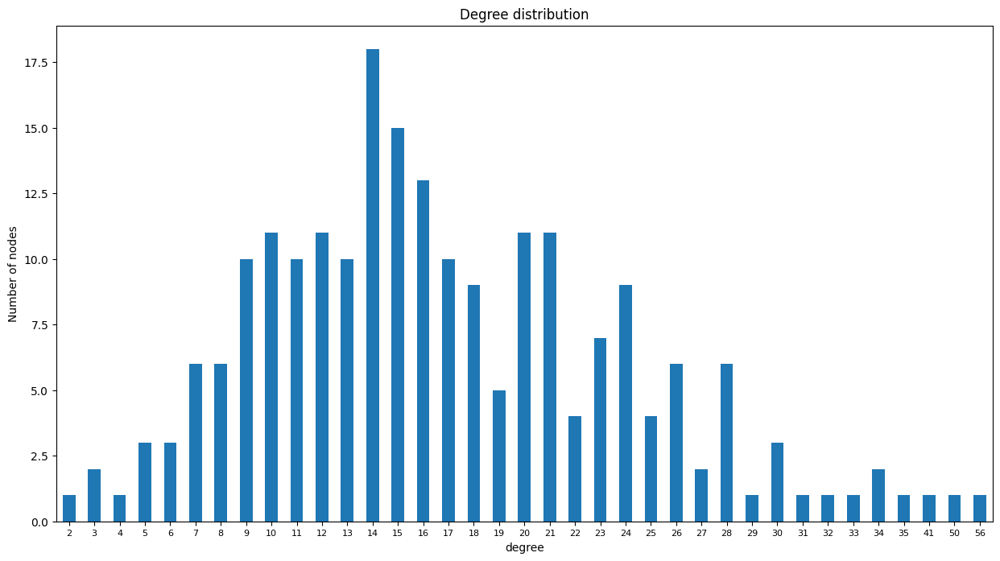

In [5]:
plt.figure(figsize=(15, 8))
degrees = [M.degree(node) for node in M.nodes()]
degree_df = pd.DataFrame(degrees, columns=["degree"])
degree_df["degree"].value_counts().sort_index().plot(kind="bar")
plt.title("Degree distribution", fontsize=12)
plt.xticks(rotation=0, fontsize=8)
plt.ylabel("Number of nodes")
plt.show()

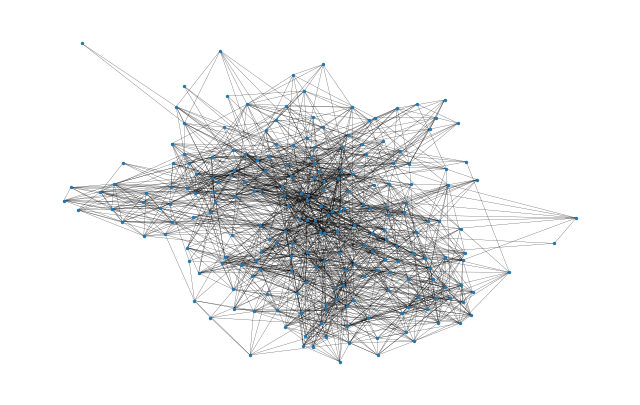

In [6]:
fig, ax = plt.subplots(figsize=(8, 5))
pos = nx.spring_layout(M)
ax.axis("off")
plot_options = {"node_size": 2, "with_labels": False, "width": 0.15}
nx.draw_networkx(M, ax=ax, **plot_options)

In [7]:
np.mean([d for _, d in M.degree()])

16.94930875576037

### Shortest-paths analysis

In [8]:
shortest_path_lengths = dict(nx.all_pairs_shortest_path_length(M))

In [9]:
diameter = max(nx.eccentricity(M, sp=shortest_path_lengths).values())
diameter

4

In [10]:
average_path_lengths = [
    np.mean(list(spl.values())) for spl in shortest_path_lengths.values()
]
# The average over all nodes
np.mean(average_path_lengths)

2.3836140075176795

Text(0, 0.5, 'Frequency (%)')

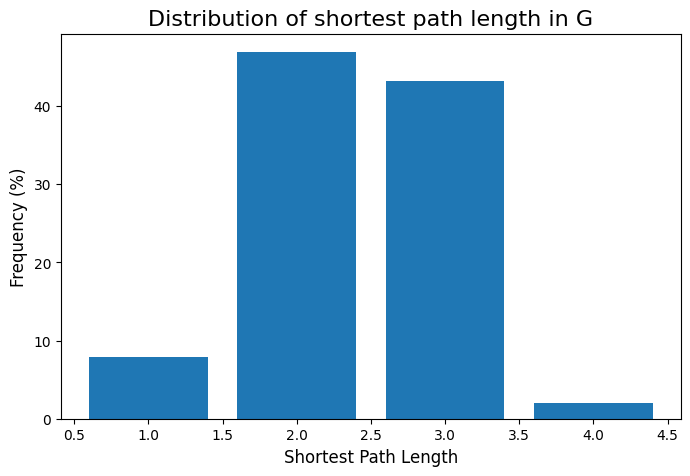

In [11]:
# We know the maximum shortest path length (the diameter), so create an array
# to store values from 0 up to (and including) diameter
path_lengths = np.zeros(diameter + 1, dtype=int)

# Extract the frequency of shortest path lengths between two nodes
for pls in shortest_path_lengths.values():
    pl, cnts = np.unique(list(pls.values()), return_counts=True)
    path_lengths[pl] += cnts

# Express frequency distribution as a percentage (ignoring path lengths of 0)
freq_percent = 100 * path_lengths[1:] / path_lengths[1:].sum()

# Plot the frequency distribution (ignoring path lengths of 0) as a percentage
fig, ax = plt.subplots(figsize=(8, 5))
ax.bar(np.arange(1, diameter + 1), height=freq_percent)
ax.set_title(
    "Distribution of shortest path length in G", fontdict={"size": 16}, loc="center"
)
ax.set_xlabel("Shortest Path Length", fontdict={"size": 12})
ax.set_ylabel("Frequency (%)", fontdict={"size": 12})

In [12]:
nx.density(M)

0.07846902201740912

In [13]:
nx.number_connected_components(M)

1

## Centrality measures

In [14]:
degree_centrality = nx.centrality.degree_centrality(
    M
)  # save results in a variable to use again
(sorted(degree_centrality.items(), key=lambda item: item[1], reverse=True))[:8]

[(70, 0.25925925925925924),
 (184, 0.23148148148148145),
 (169, 0.1898148148148148),
 (113, 0.16203703703703703),
 (120, 0.15740740740740738),
 (156, 0.15740740740740738),
 (128, 0.15277777777777776),
 (27, 0.14814814814814814)]

In [15]:
(sorted(M.degree, key=lambda item: item[1], reverse=True))[:8]

[(70, 56),
 (184, 50),
 (169, 41),
 (113, 35),
 (120, 34),
 (156, 34),
 (128, 33),
 (27, 32)]

Text(0, 0.5, 'Counts')

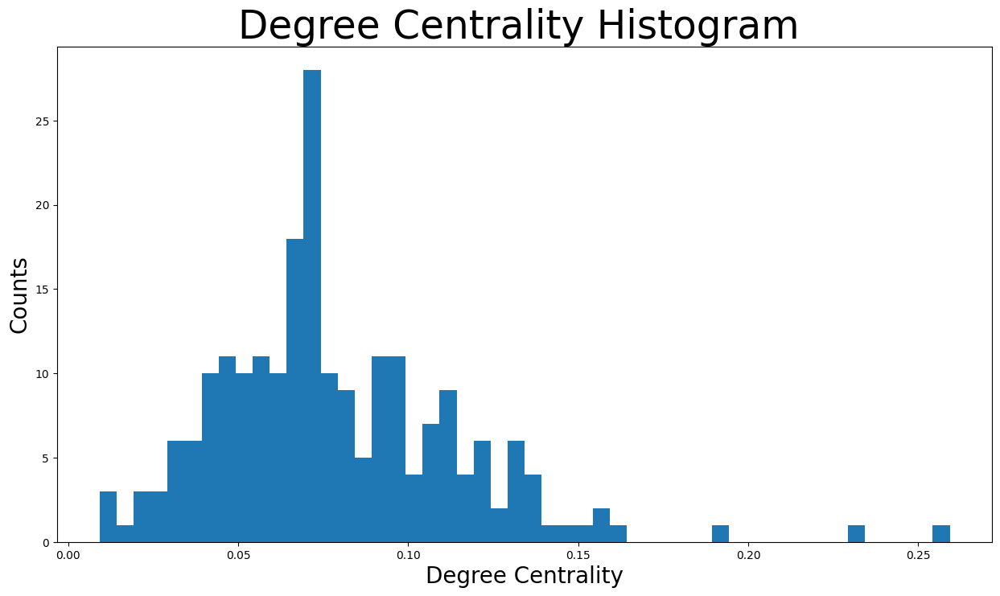

In [16]:
plt.figure(figsize=(15, 8))
plt.hist(degree_centrality.values(), bins=50)
#plt.xticks(ticks=[0, 0.025, 0.05, 0.1, 0.15, 0.2])  # set the x axis ticks
plt.title("Degree Centrality Histogram ", fontdict={"size": 35}, loc="center")
plt.xlabel("Degree Centrality", fontdict={"size": 20})
plt.ylabel("Counts", fontdict={"size": 20})

(-1.0895742680944343,
 0.9616668191162306,
 -1.0553954437513742,
 1.1953090693157415)

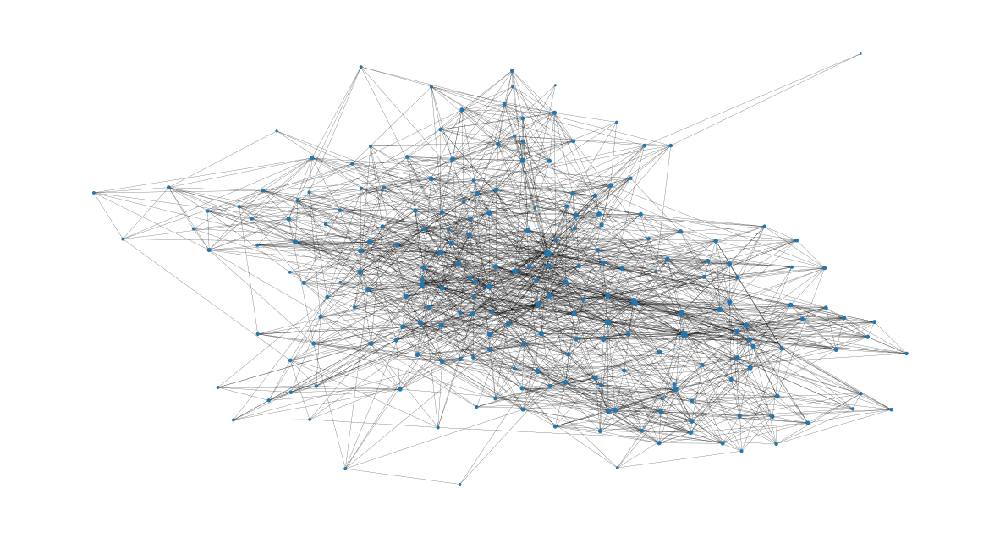

In [17]:
node_size = [
    v * 100 for v in degree_centrality.values()
]  # set up nodes size for a nice graph representation
plt.figure(figsize=(15, 8))
nx.draw_networkx(M, pos=pos, node_size=node_size, with_labels=False, width=0.15)
plt.axis("off")

## Betweenness Centrality

In [18]:
betweenness_centrality = nx.centrality.betweenness_centrality(
    M
)  # save results in a variable to use again
(sorted(betweenness_centrality.items(), key=lambda item: item[1], reverse=True))[:8]

[(70, 0.06586755616874802),
 (184, 0.04897830468329907),
 (113, 0.04564484595777886),
 (98, 0.03158816404910712),
 (169, 0.02825048335655033),
 (27, 0.027127935410213168),
 (120, 0.026012262825449526),
 (128, 0.025729540709640744)]

Text(0, 0.5, 'Counts')

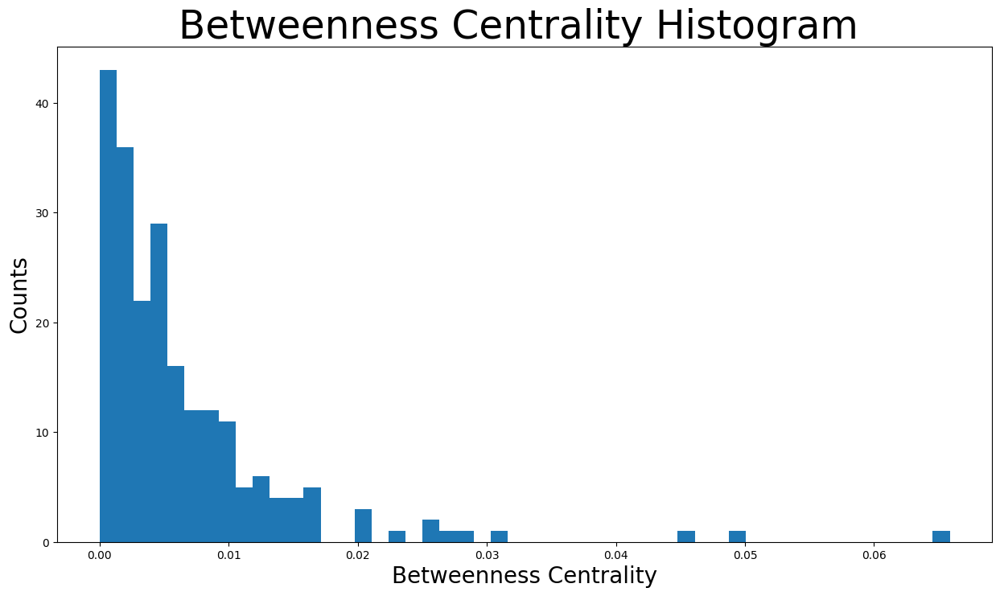

In [19]:
plt.figure(figsize=(15, 8))
plt.hist(betweenness_centrality.values(), bins=50)
#plt.xticks(ticks=[0, 0.02, 0.1, 0.2, 0.3, 0.4, 0.5])  # set the x axis ticks
plt.title("Betweenness Centrality Histogram ", fontdict={"size": 35}, loc="center")
plt.xlabel("Betweenness Centrality", fontdict={"size": 20})
plt.ylabel("Counts", fontdict={"size": 20})

(-1.0895742680944343,
 0.9616668191162306,
 -1.0553954437513742,
 1.1953090693157415)

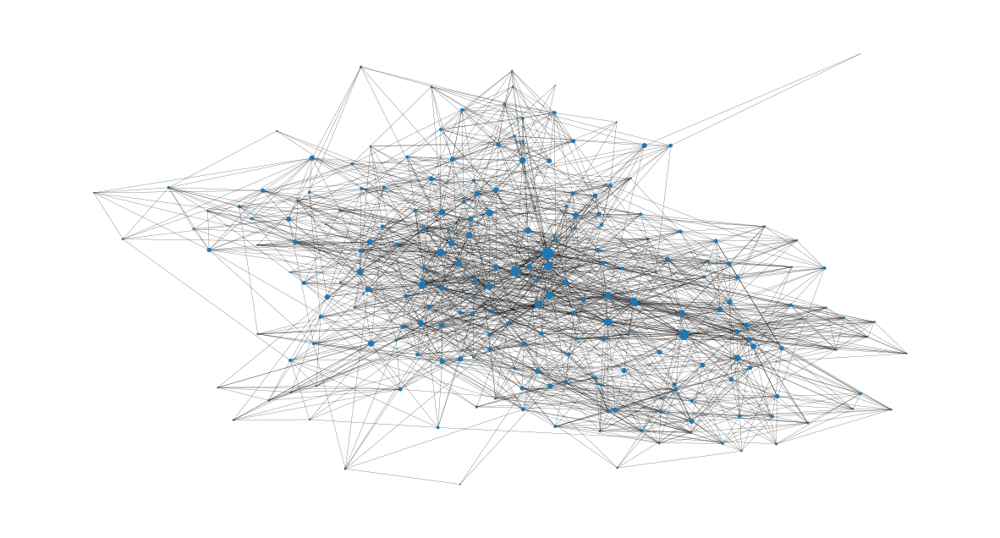

In [20]:
node_size = [
    v * 1200 for v in betweenness_centrality.values()
]  # set up nodes size for a nice graph representation
plt.figure(figsize=(15, 8))
nx.draw_networkx(M, pos=pos, node_size=node_size, with_labels=False, width=0.15)
plt.axis("off")

## Closeness Centrality

In [21]:
closeness_centrality = nx.centrality.closeness_centrality(
    M
)  # save results in a variable to use again
(sorted(closeness_centrality.items(), key=lambda item: item[1], reverse=True))[:8]

[(70, 0.5454545454545454),
 (184, 0.5217391304347826),
 (169, 0.5070422535211268),
 (113, 0.5058548009367682),
 (156, 0.5034965034965035),
 (54, 0.5023255813953489),
 (120, 0.5),
 (98, 0.4954128440366973)]

Text(0, 0.5, 'Counts')

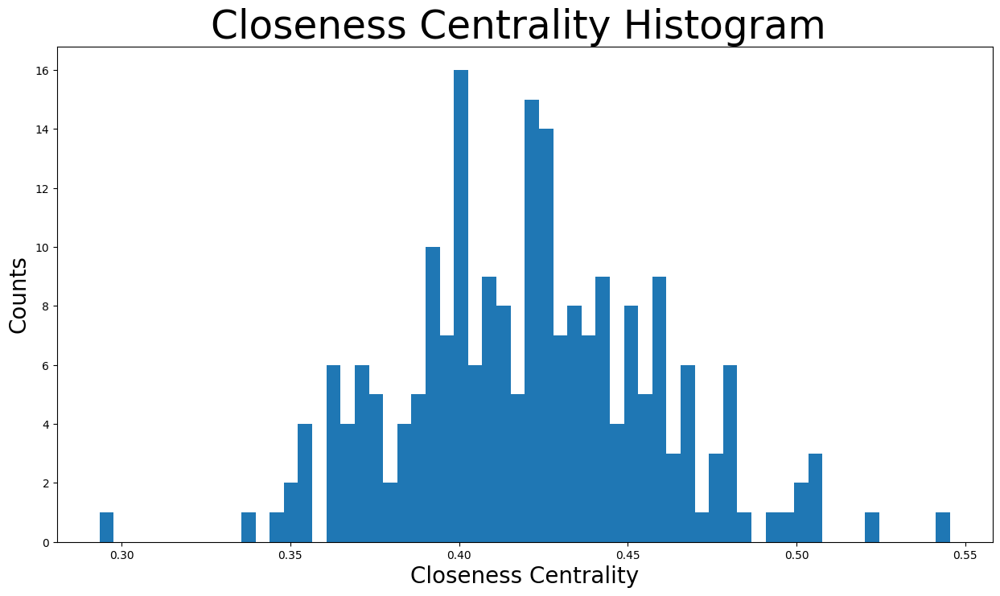

In [22]:
plt.figure(figsize=(15, 8))
plt.hist(closeness_centrality.values(), bins=60)
plt.title("Closeness Centrality Histogram ", fontdict={"size": 35}, loc="center")
plt.xlabel("Closeness Centrality", fontdict={"size": 20})
plt.ylabel("Counts", fontdict={"size": 20})

(-1.1623820854335976,
 0.7088781371821449,
 -1.0488492932806566,
 1.0381964917723558)

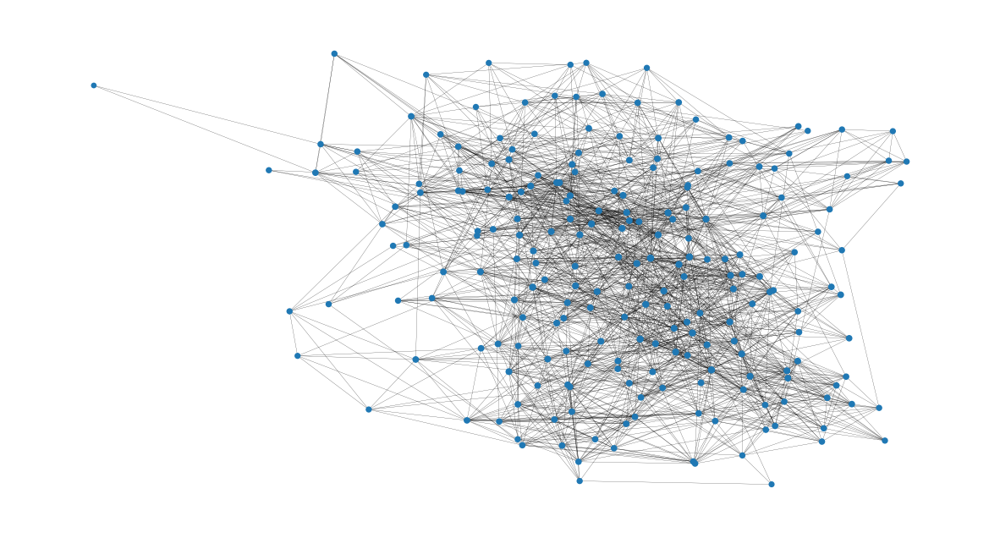

In [23]:
pos = nx.spring_layout(M, iterations=15, seed=1721)
node_size = [
    v * 50 for v in closeness_centrality.values()
]  # set up nodes size for a nice graph representation
plt.figure(figsize=(15, 8))
nx.draw_networkx(M, pos=pos, node_size=node_size, with_labels=False, width=0.15)
plt.axis("off")

## Jazz - Dataset

In [24]:
G = nx.read_edgelist("out.arenas-jazz", create_using = nx.Graph(), nodetype = int)

Total number of edges and nodes:

In [25]:
print(G)

Graph with 198 nodes and 2742 edges


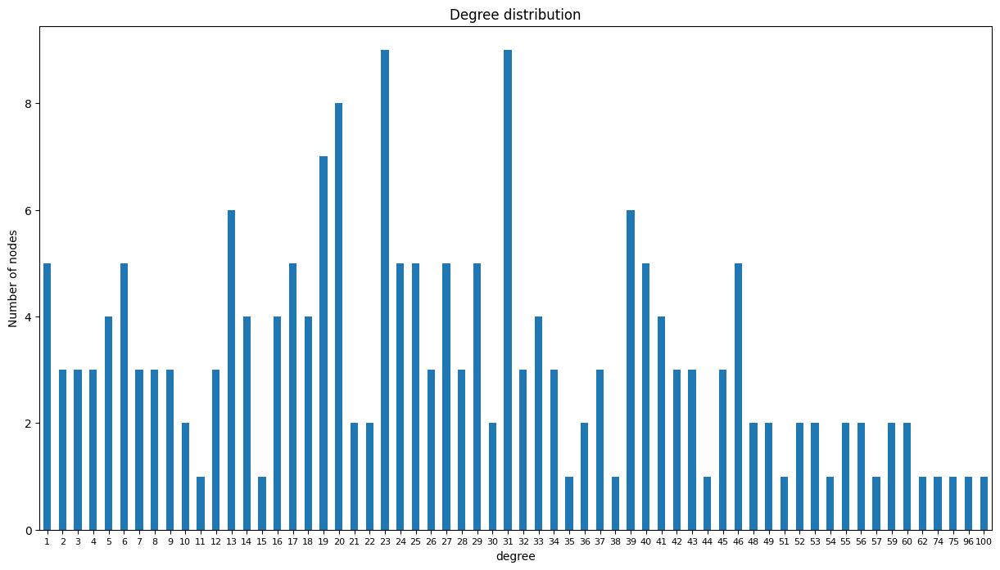

In [26]:
plt.figure(figsize=(15, 8))
degrees = [G.degree(node) for node in G.nodes()]
degree_df = pd.DataFrame(degrees, columns=["degree"])
degree_df["degree"].value_counts().sort_index().plot(kind="bar")
plt.title("Degree distribution", fontsize=12)
plt.xticks(rotation=0, fontsize=8)
plt.ylabel("Number of nodes")
plt.show()

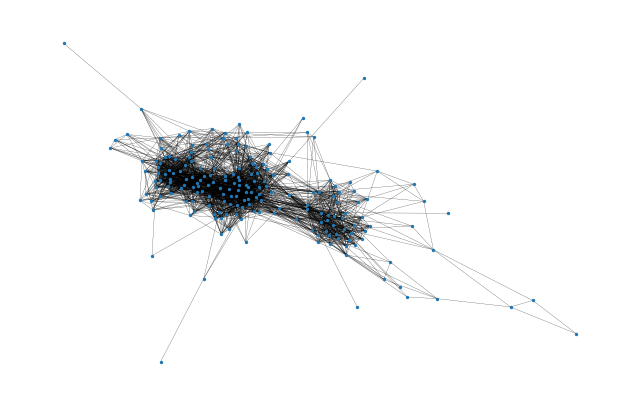

In [27]:
fig, ax = plt.subplots(figsize=(8, 5))
pos = nx.spring_layout(G)
ax.axis("off")
plot_options = {"node_size": 2, "with_labels": False, "width": 0.15}
nx.draw_networkx(G, pos=pos, ax=ax, **plot_options)

Average degree of a node:

In [28]:
np.mean([d for _, d in G.degree()])

27.696969696969695

### Shortest-paths analysis

In [29]:
shortest_path_lengths = dict(nx.all_pairs_shortest_path_length(G))

In [30]:
diameter = max(nx.eccentricity(G, sp=shortest_path_lengths).values())
diameter

6

In [31]:
average_path_lengths = [
    np.mean(list(spl.values())) for spl in shortest_path_lengths.values()
]
# The average over all nodes
np.mean(average_path_lengths)

2.2237526782981325

Text(0, 0.5, 'Frequency (%)')

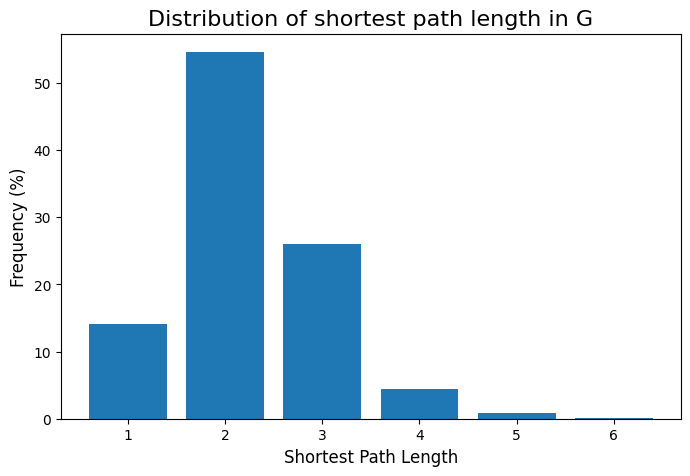

In [32]:
# We know the maximum shortest path length (the diameter), so create an array
# to store values from 0 up to (and including) diameter
path_lengths = np.zeros(diameter + 1, dtype=int)

# Extract the frequency of shortest path lengths between two nodes
for pls in shortest_path_lengths.values():
    pl, cnts = np.unique(list(pls.values()), return_counts=True)
    path_lengths[pl] += cnts

# Express frequency distribution as a percentage (ignoring path lengths of 0)
freq_percent = 100 * path_lengths[1:] / path_lengths[1:].sum()

# Plot the frequency distribution (ignoring path lengths of 0) as a percentage
fig, ax = plt.subplots(figsize=(8, 5))
ax.bar(np.arange(1, diameter + 1), height=freq_percent)
ax.set_title(
    "Distribution of shortest path length in G", fontdict={"size": 16}, loc="center"
)
ax.set_xlabel("Shortest Path Length", fontdict={"size": 12})
ax.set_ylabel("Frequency (%)", fontdict={"size": 12})

In [33]:
nx.density(G)

0.14059375480695277

In [34]:
nx.number_connected_components(G)

1

## Centrality measures

In [35]:
degree_centrality = nx.centrality.degree_centrality(
    G
)  # save results in a variable to use again
(sorted(degree_centrality.items(), key=lambda item: item[1], reverse=True))[:8]

[(67, 0.5076142131979695),
 (7, 0.4873096446700507),
 (20, 0.38071065989847713),
 (23, 0.3756345177664974),
 (90, 0.3147208121827411),
 (13, 0.3045685279187817),
 (18, 0.3045685279187817),
 (109, 0.299492385786802)]

In [36]:
(sorted(G.degree, key=lambda item: item[1], reverse=True))[:8]

[(67, 100),
 (7, 96),
 (20, 75),
 (23, 74),
 (90, 62),
 (13, 60),
 (18, 60),
 (109, 59)]

Text(0, 0.5, 'Counts')

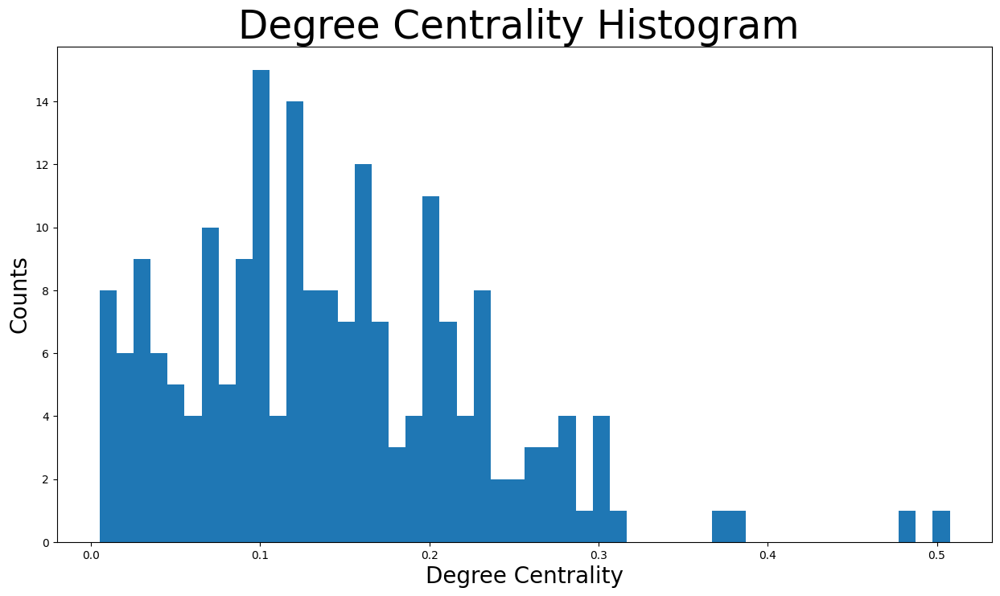

In [37]:
plt.figure(figsize=(15, 8))
plt.hist(degree_centrality.values(), bins=50)
#plt.xticks(ticks=[0, 0.025, 0.05, 0.1, 0.15, 0.2])  # set the x axis ticks
plt.title("Degree Centrality Histogram ", fontdict={"size": 35}, loc="center")
plt.xlabel("Degree Centrality", fontdict={"size": 20})
plt.ylabel("Counts", fontdict={"size": 20})

(-0.7684763251370315,
 1.1680452616646047,
 -0.7575771880767365,
 0.6864377474274579)

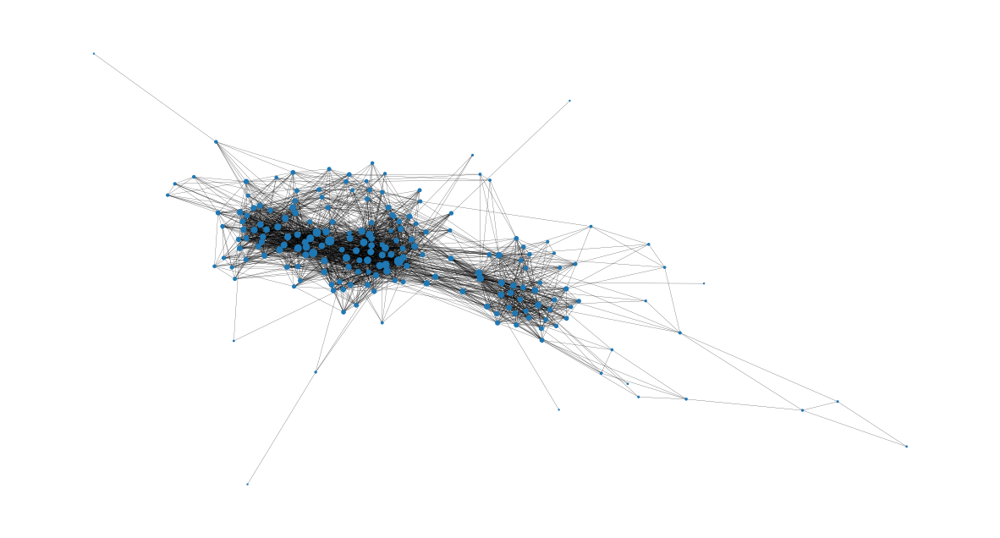

In [38]:
node_size = [
    v * 100 for v in degree_centrality.values()
]  # set up nodes size for a nice graph representation
plt.figure(figsize=(15, 8))
nx.draw_networkx(G, pos=pos, node_size=node_size, with_labels=False, width=0.15)
plt.axis("off")

## Betweenness Centrality

In [39]:
betweenness_centrality = nx.centrality.betweenness_centrality(
    G
)  # save results in a variable to use again
(sorted(betweenness_centrality.items(), key=lambda item: item[1], reverse=True))[:8]

[(67, 0.15105615373941586),
 (31, 0.06829206963519824),
 (7, 0.057538917986120146),
 (70, 0.04517867657801444),
 (23, 0.03960002124911093),
 (32, 0.039381158328549715),
 (47, 0.02955084339740044),
 (30, 0.028316907207527057)]

Text(0, 0.5, 'Counts')

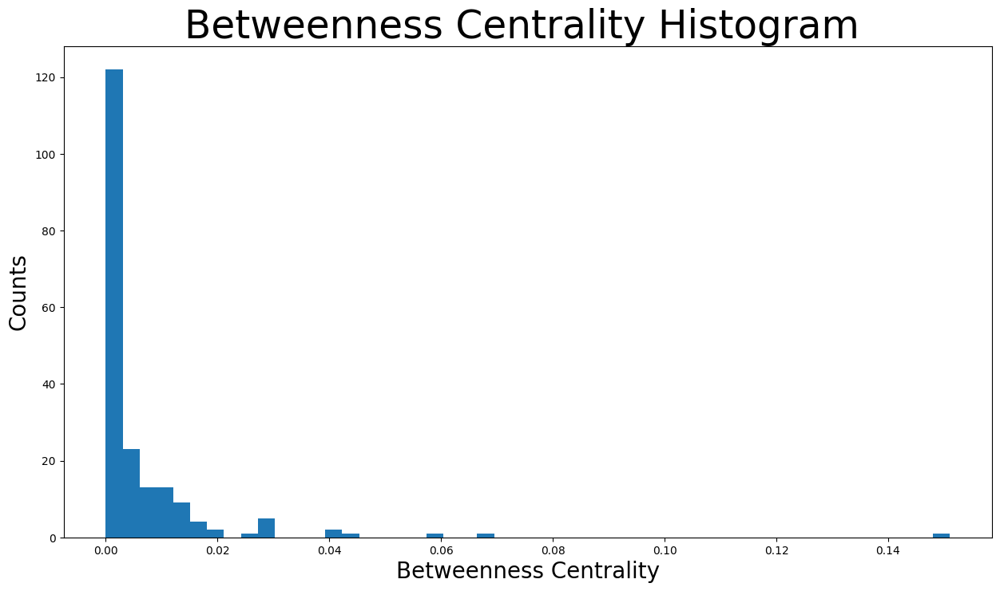

In [40]:
plt.figure(figsize=(15, 8))
plt.hist(betweenness_centrality.values(), bins=50)
#plt.xticks(ticks=[0, 0.02, 0.1, 0.2, 0.3, 0.4, 0.5])  # set the x axis ticks
plt.title("Betweenness Centrality Histogram ", fontdict={"size": 35}, loc="center")
plt.xlabel("Betweenness Centrality", fontdict={"size": 20})
plt.ylabel("Counts", fontdict={"size": 20})

(-0.7684763251370315,
 1.1680452616646047,
 -0.7575771880767365,
 0.6864377474274579)

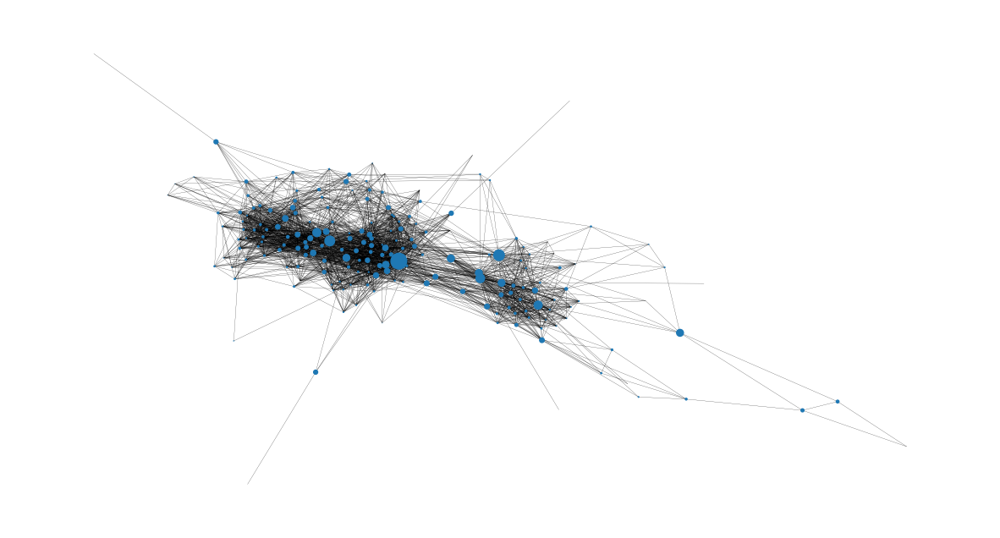

In [41]:
node_size = [
    v * 1200 for v in betweenness_centrality.values()
]  # set up nodes size for a nice graph representation
plt.figure(figsize=(15, 8))
nx.draw_networkx(G, pos=pos, node_size=node_size, with_labels=False, width=0.15)
plt.axis("off")

## Closeness Centrality

In [42]:
closeness_centrality = nx.centrality.closeness_centrality(
    G
)  # save results in a variable to use again
(sorted(closeness_centrality.items(), key=lambda item: item[1], reverse=True))[:8]

[(67, 0.6480263157894737),
 (7, 0.5898203592814372),
 (23, 0.5811209439528023),
 (90, 0.5596590909090909),
 (93, 0.5580736543909348),
 (20, 0.5549295774647888),
 (101, 0.5487465181058496),
 (74, 0.5487465181058496)]

Text(0, 0.5, 'Counts')

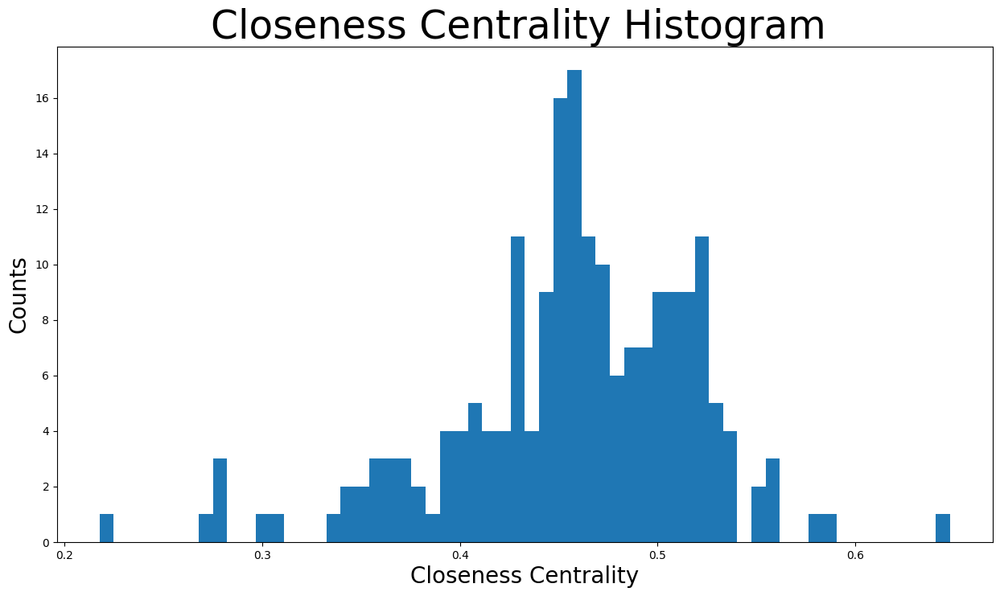

In [43]:
plt.figure(figsize=(15, 8))
plt.hist(closeness_centrality.values(), bins=60)
plt.title("Closeness Centrality Histogram ", fontdict={"size": 35}, loc="center")
plt.xlabel("Closeness Centrality", fontdict={"size": 20})
plt.ylabel("Counts", fontdict={"size": 20})

(-0.512361565348264,
 0.7801855087117263,
 -1.1847113512125707,
 0.9438670770465771)

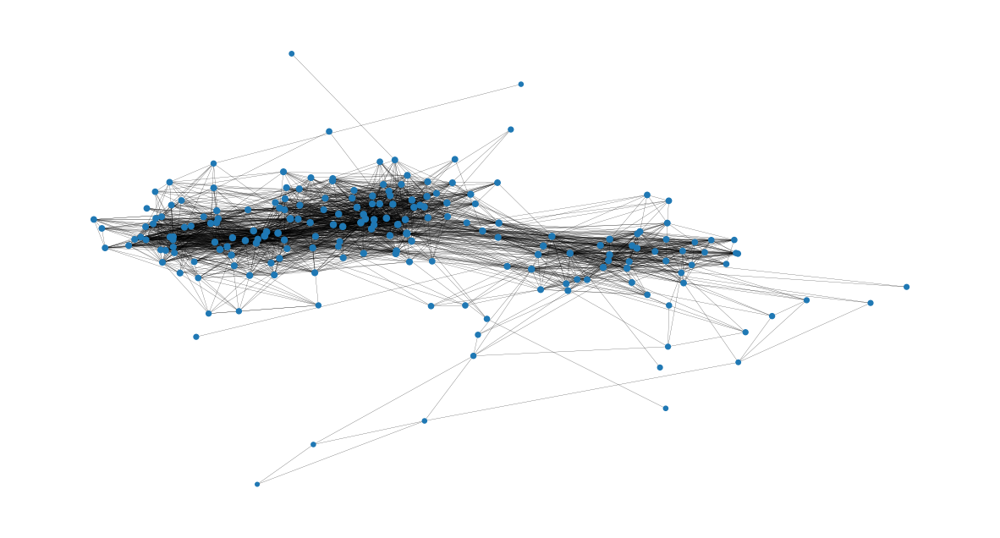

In [44]:
pos = nx.spring_layout(G, iterations=15, seed=1721)
node_size = [
    v * 50 for v in closeness_centrality.values()
]  # set up nodes size for a nice graph representation
plt.figure(figsize=(15, 8))
nx.draw_networkx(G, pos=pos, node_size=node_size, with_labels=False, width=0.15)
plt.axis("off")

# TASK 2a

In [45]:
from igraph import *
import cairo

In [46]:
MM = Graph().from_networkx(M)

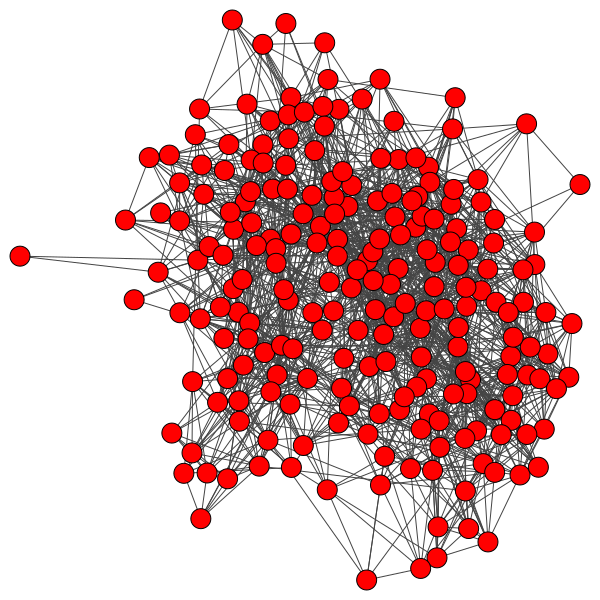

In [47]:
plot(MM)

In [48]:
summary(MM)

IGRAPH U-W- 217 1839 -- 
+ attr: _nx_name (v), weight (e)


In [49]:
MM.degree()[:10]

[15, 30, 27, 16, 18, 12, 15, 17, 11, 21]

In [50]:
MM.betweenness()[:10]

[88.86722689682719,
 460.14564342054274,
 298.2121085936333,
 104.78485733010156,
 174.25021474155307,
 206.76592353136724,
 31.897941880050045,
 127.92788232879329,
 98.62738029816599,
 182.93312815004842]

In [51]:
ebs = MM.edge_betweenness()
max_eb = max(ebs)
[MM.es[idx].tuple for idx, eb in enumerate(ebs) if eb == max_eb]

[(112, 183)]

In [52]:
MM.edge_betweenness()[:10]

[22.080646507692272,
 15.529666603743193,
 19.3779677999628,
 24.60215075600311,
 18.242226557031127,
 9.450550248219509,
 19.05829433081447,
 18.50714471038944,
 13.354862240997456,
 12.047322628255033]

In [53]:
import matplotlib
import matplotlib.pyplot as plt
import numpy as np
%matplotlib inline
plt.style.use('fivethirtyeight')
matplotlib.rcParams['figure.dpi']= 150

v_degree = MM.degree()
v_betweenness = MM.betweenness()
v_pagerank = MM.pagerank()

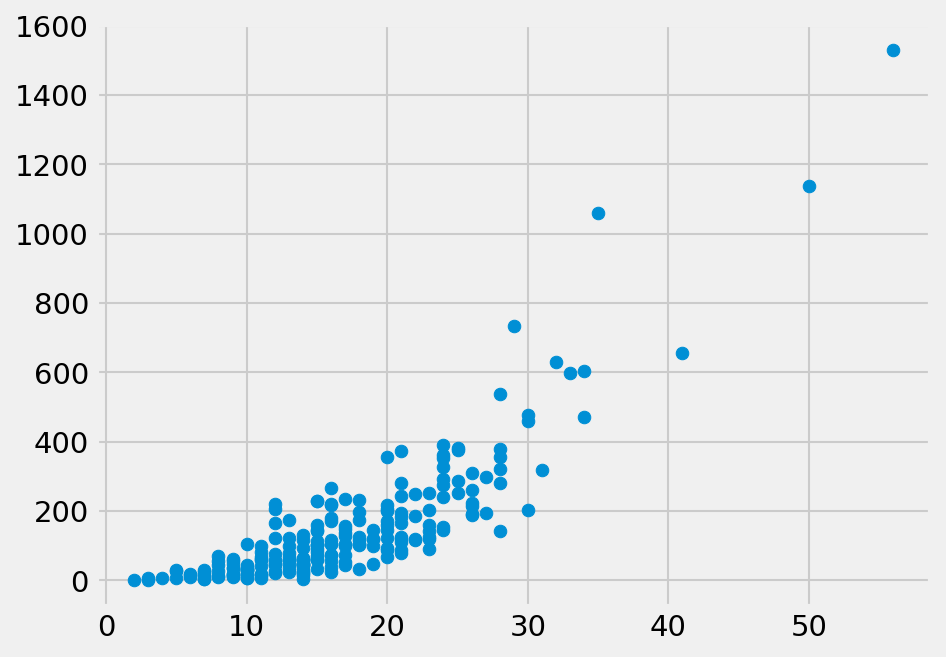

In [54]:
plt.scatter(v_degree, v_betweenness)

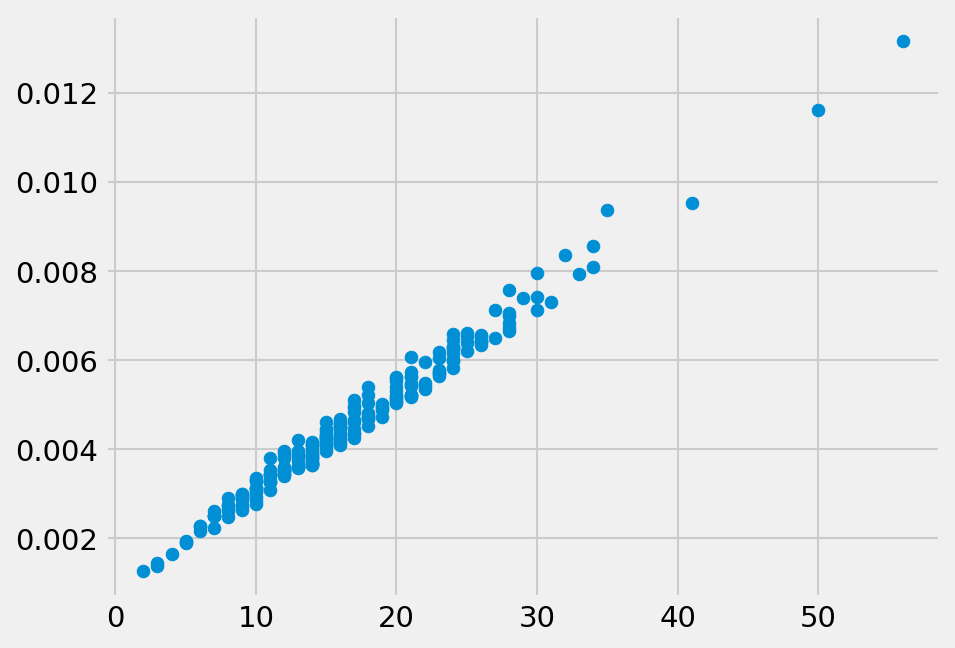

In [55]:
plt.scatter(v_degree, v_pagerank)

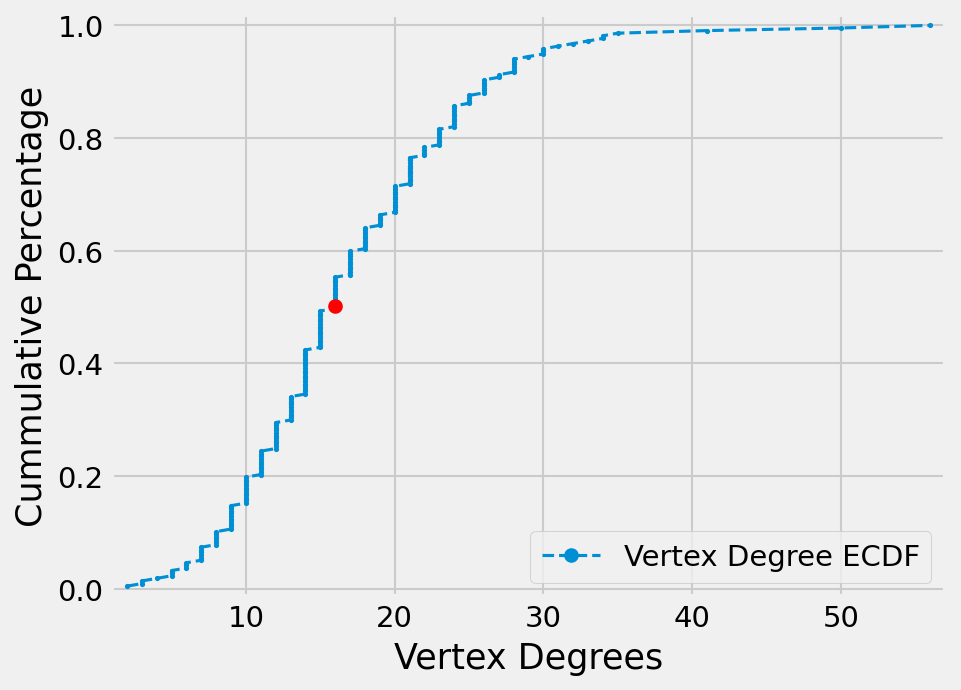

In [56]:
def ecdf(data):
    x = np.sort(data)
    y = np.arange(1, len(x)+1)/len(x) # percentiles
    return(x,y)

def plot_ecdf(data, xlabel=None, ylabel='Cummulative Percentage', label=None):
    x,y = ecdf(data)
    plt.plot(x, y, marker='.', markersize=3, linestyle='--', lw=1.5,label=label)
    plt.legend(markerscale=4)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.margins(0.02)
    
    x_50 = np.percentile(x, 50)
    y_50 = np.percentile(y, 50)
    # mark 50th
    plt.plot(x_50, y_50, marker='o', color='red',
         linestyle='none')


plot_ecdf(v_degree, xlabel="Vertex Degrees", label="Vertex Degree ECDF")

In [57]:
GG = Graph().from_networkx(G)

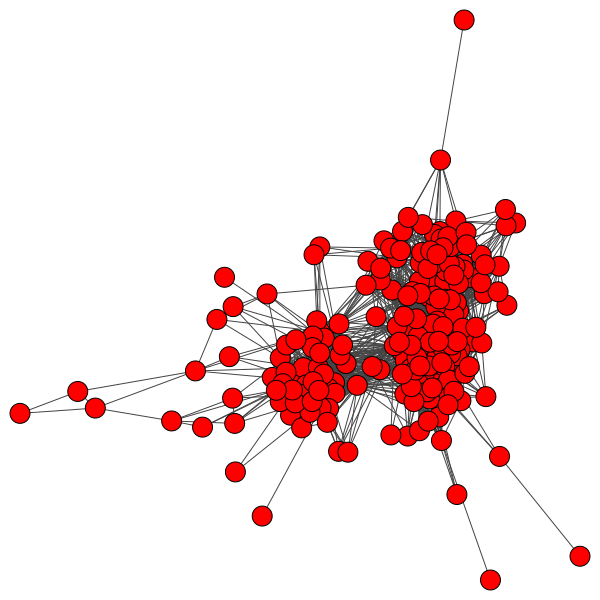

In [58]:
plot(GG)

In [59]:
summary(GG)

IGRAPH U--- 198 2742 -- 
+ attr: _nx_name (v)


In [60]:
GG.degree()[:10]

[23, 42, 40, 46, 60, 49, 49, 23, 20, 60]

In [61]:
GG.betweenness()[:10]

[16.43601295248606,
 256.5639374586854,
 83.28514774015792,
 65.98222547544447,
 271.8106330288494,
 84.57923222873133,
 92.52515555106181,
 38.972027753544204,
 34.82694990965655,
 182.54149216052798]

In [62]:
## Find out edge of highest cenrality
ebs = GG.edge_betweenness()
max_eb = max(ebs)
[GG.es[idx].tuple for idx, eb in enumerate(ebs) if eb == max_eb]

[(15, 125)]

In [63]:
GG.edge_betweenness()[:10]

[10.002132472223503,
 8.964903156616046,
 7.069750677152828,
 17.25520000964242,
 7.4580508807290276,
 7.452880758453641,
 7.573695047759841,
 3.662399514781358,
 9.501112844161755,
 11.580182099113419]

In [64]:
import matplotlib
import matplotlib.pyplot as plt
import numpy as np
%matplotlib inline
plt.style.use('fivethirtyeight')
matplotlib.rcParams['figure.dpi']= 150

v_degree = GG.degree()
v_betweenness = GG.betweenness()
v_pagerank = GG.pagerank()

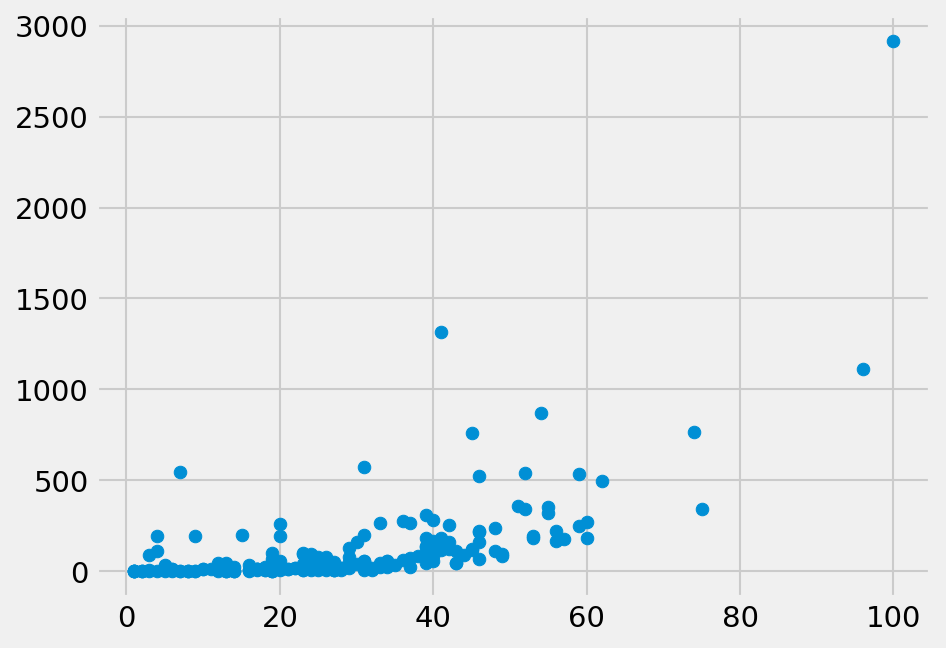

In [65]:
# correlation
plt.scatter(v_degree, v_betweenness)

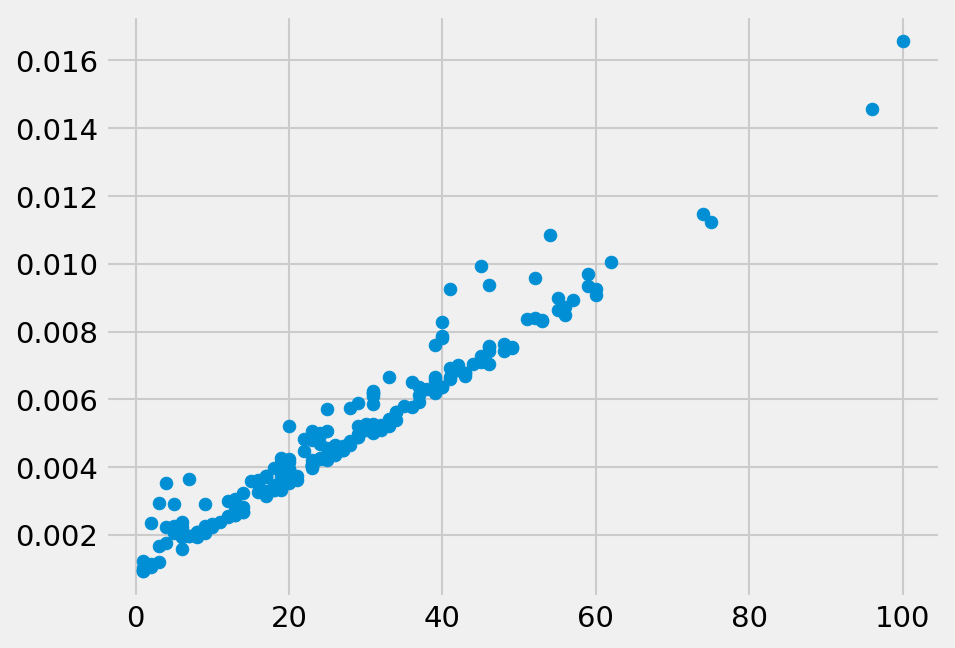

In [66]:
plt.scatter(v_degree, v_pagerank)

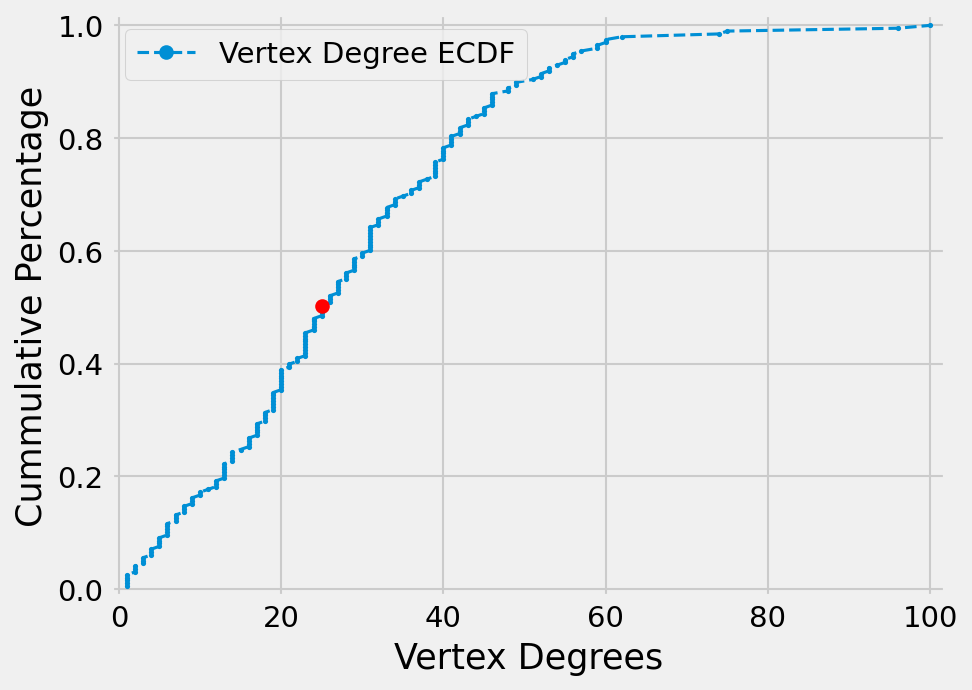

In [67]:
plot_ecdf(v_degree, xlabel="Vertex Degrees", label="Vertex Degree ECDF")

# TASK 2b

In [68]:
G_1 = nx.barbell_graph(43, 9)

In [69]:
print(G_1)

Graph with 95 nodes and 1816 edges


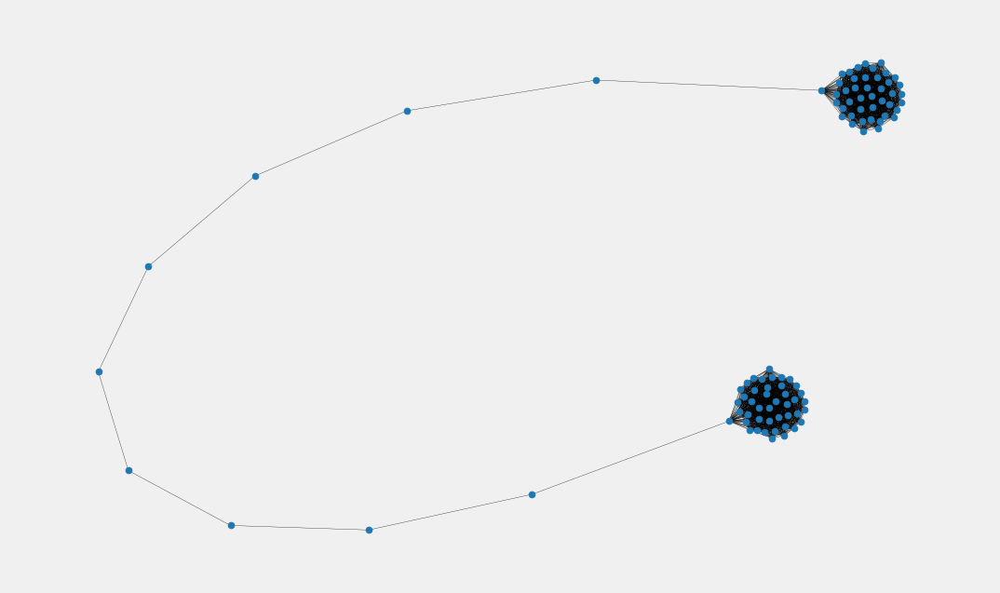

In [70]:
fig, ax = plt.subplots(figsize=(8, 5))
ax.axis("off")
plot_options = {"node_size": 10, "with_labels": False, "width": 0.15}
nx.draw_networkx(G_1, pos=nx.spring_layout(G_1), ax=ax, **plot_options)

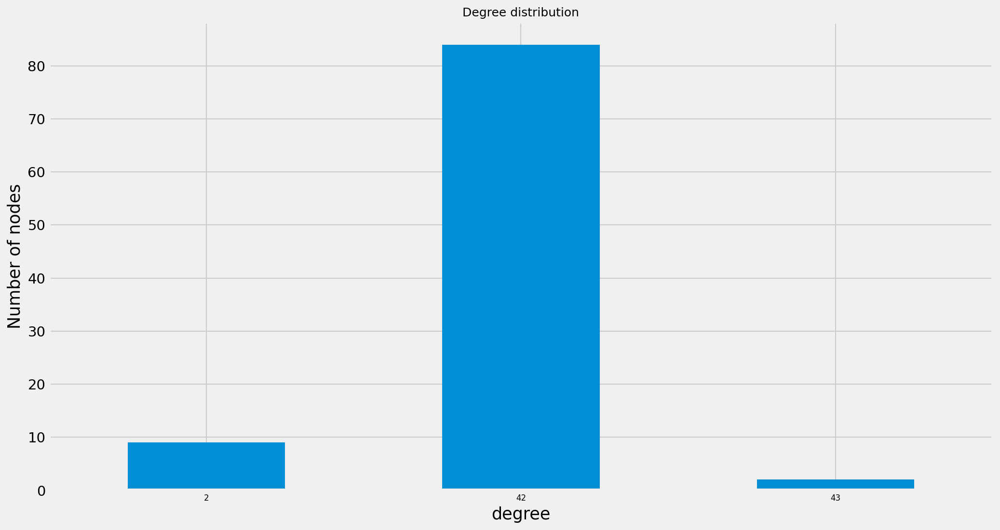

In [71]:
plt.figure(figsize=(15, 8))
degrees = [G_1.degree(node) for node in G_1.nodes()]
degree_df = pd.DataFrame(degrees, columns=["degree"])
degree_df["degree"].value_counts().sort_index().plot(kind="bar")
plt.title("Degree distribution", fontsize=12)
plt.xticks(rotation=0, fontsize=8)
plt.ylabel("Number of nodes")
plt.show()

Average degree of a node:

In [72]:
np.mean([d for _, d in G_1.degree()])

38.23157894736842

### Shortest-paths analysis

In [73]:
shortest_path_lengths = dict(nx.all_pairs_shortest_path_length(G))

In [74]:
diameter = max(nx.eccentricity(G, sp=shortest_path_lengths).values())
diameter

6

In [75]:
average_path_lengths = [
    np.mean(list(spl.values())) for spl in shortest_path_lengths.values()
]
# The average over all nodes
np.mean(average_path_lengths)

2.2237526782981325

Text(0, 0.5, 'Frequency (%)')

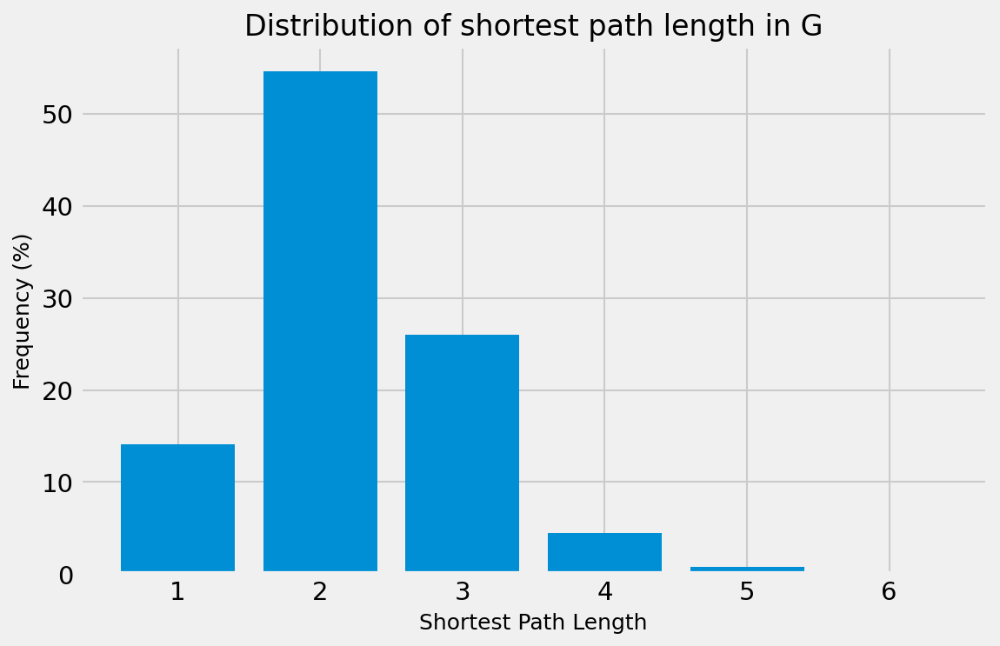

In [76]:
path_lengths = np.zeros(diameter + 1, dtype=int)

for pls in shortest_path_lengths.values():
    pl, cnts = np.unique(list(pls.values()), return_counts=True)
    path_lengths[pl] += cnts

freq_percent = 100 * path_lengths[1:] / path_lengths[1:].sum()

fig, ax = plt.subplots(figsize=(8, 5))
ax.bar(np.arange(1, diameter + 1), height=freq_percent)
ax.set_title(
    "Distribution of shortest path length in G", fontdict={"size": 16}, loc="center"
)
ax.set_xlabel("Shortest Path Length", fontdict={"size": 12})
ax.set_ylabel("Frequency (%)", fontdict={"size": 12})

In [77]:
nx.density(G)

0.14059375480695277

In [78]:
nx.number_connected_components(G)

1

## Centrality measures

In [79]:
degree_centrality = nx.centrality.degree_centrality(
    G
)  # save results in a variable to use again
(sorted(degree_centrality.items(), key=lambda item: item[1], reverse=True))[:8]

[(67, 0.5076142131979695),
 (7, 0.4873096446700507),
 (20, 0.38071065989847713),
 (23, 0.3756345177664974),
 (90, 0.3147208121827411),
 (13, 0.3045685279187817),
 (18, 0.3045685279187817),
 (109, 0.299492385786802)]

In [80]:
(sorted(G.degree, key=lambda item: item[1], reverse=True))[:8]

[(67, 100),
 (7, 96),
 (20, 75),
 (23, 74),
 (90, 62),
 (13, 60),
 (18, 60),
 (109, 59)]

Text(0, 0.5, 'Counts')

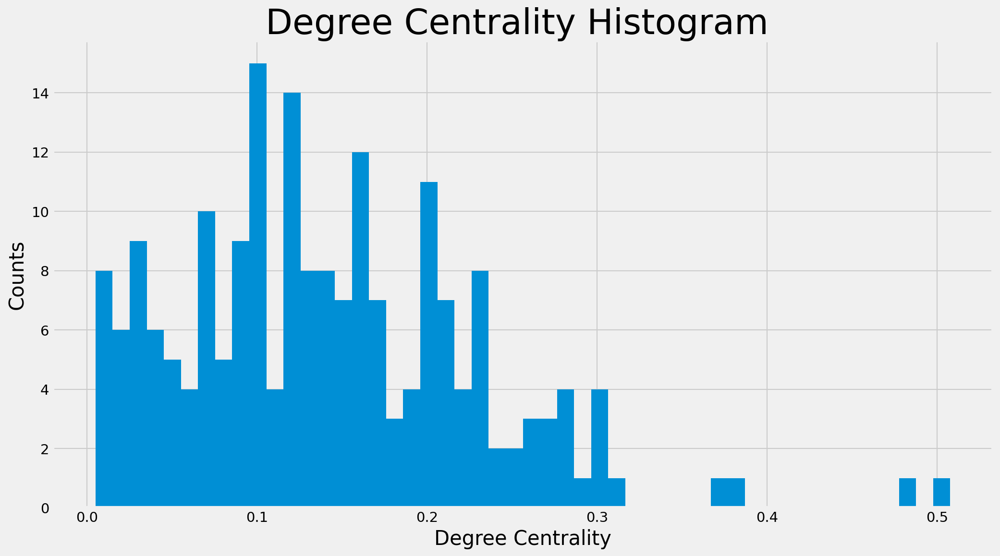

In [81]:
plt.figure(figsize=(15, 8))
plt.hist(degree_centrality.values(), bins=50)
#plt.xticks(ticks=[0, 0.025, 0.05, 0.1, 0.15, 0.2])  # set the x axis ticks
plt.title("Degree Centrality Histogram ", fontdict={"size": 35}, loc="center")
plt.xlabel("Degree Centrality", fontdict={"size": 20})
plt.ylabel("Counts", fontdict={"size": 20})

(-0.512361565348264,
 0.7801855087117263,
 -1.1847113512125707,
 0.9438670770465771)

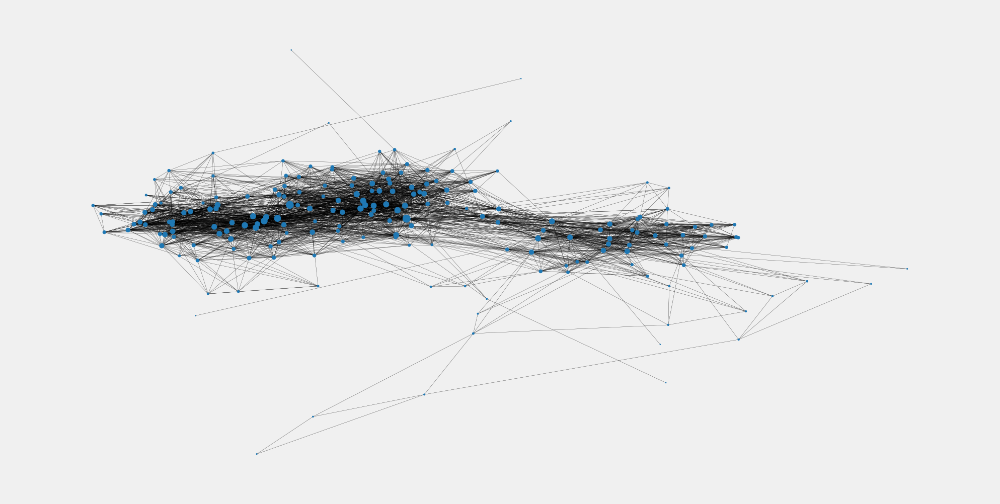

In [82]:
node_size = [
    v * 100 for v in degree_centrality.values()
]  # set up nodes size for a nice graph representation
plt.figure(figsize=(15, 8))
nx.draw_networkx(G, pos=pos, node_size=node_size, with_labels=False, width=0.15)
plt.axis("off")

## Betweenness Centrality

In [83]:
betweenness_centrality = nx.centrality.betweenness_centrality(
    G
)  # save results in a variable to use again
(sorted(betweenness_centrality.items(), key=lambda item: item[1], reverse=True))[:8]

[(67, 0.15105615373941586),
 (31, 0.06829206963519824),
 (7, 0.057538917986120146),
 (70, 0.04517867657801444),
 (23, 0.03960002124911093),
 (32, 0.039381158328549715),
 (47, 0.02955084339740044),
 (30, 0.028316907207527057)]

Text(0, 0.5, 'Counts')

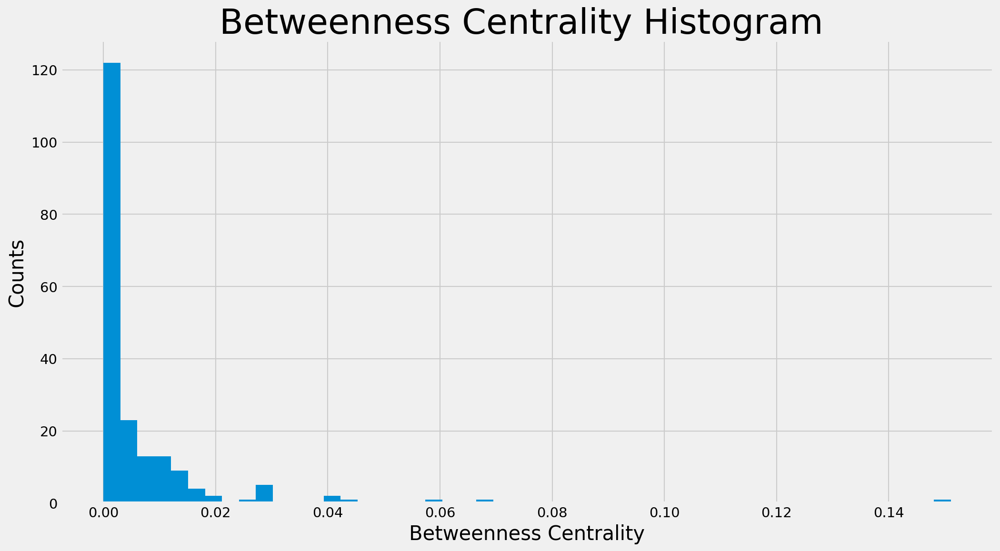

In [84]:
plt.figure(figsize=(15, 8))
plt.hist(betweenness_centrality.values(), bins=50)
#plt.xticks(ticks=[0, 0.02, 0.1, 0.2, 0.3, 0.4, 0.5])  # set the x axis ticks
plt.title("Betweenness Centrality Histogram ", fontdict={"size": 35}, loc="center")
plt.xlabel("Betweenness Centrality", fontdict={"size": 20})
plt.ylabel("Counts", fontdict={"size": 20})

(-0.512361565348264,
 0.7801855087117263,
 -1.1847113512125707,
 0.9438670770465771)

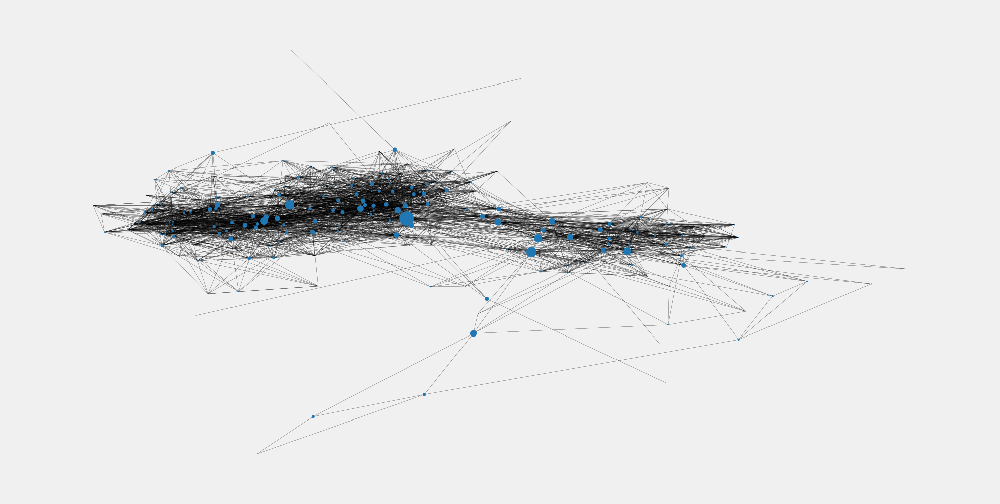

In [85]:
node_size = [
    v * 1200 for v in betweenness_centrality.values()
]  # set up nodes size for a nice graph representation
plt.figure(figsize=(15, 8))
nx.draw_networkx(G, pos=pos, node_size=node_size, with_labels=False, width=0.15)
plt.axis("off")

In [86]:
G_2 = nx.complete_graph(77)

In [87]:
print(G_2)

Graph with 77 nodes and 2926 edges


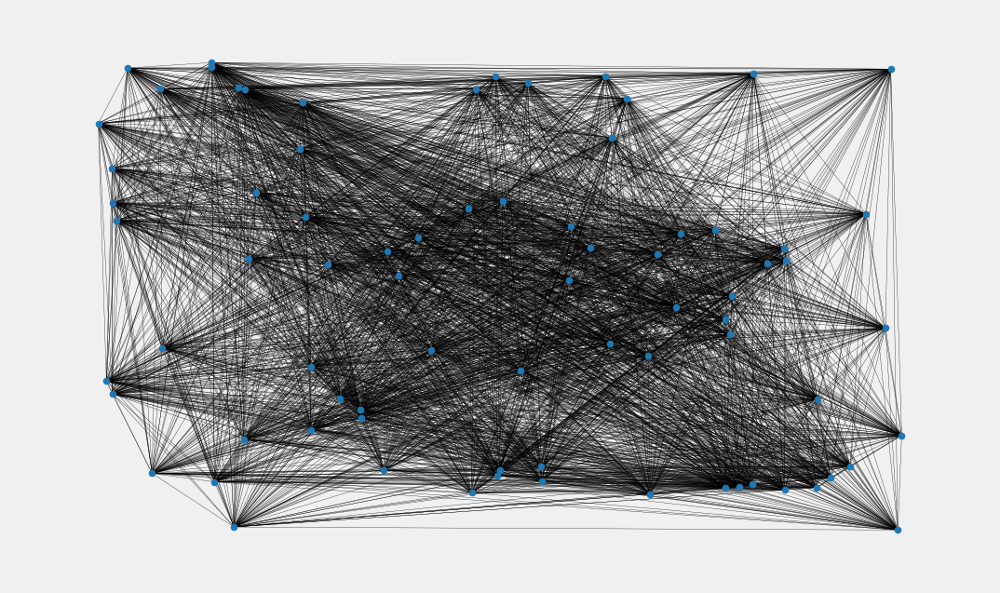

In [88]:
fig, ax = plt.subplots(figsize=(8, 5))
ax.axis("off")
plot_options = {"node_size": 10, "with_labels": False, "width": 0.15}
nx.draw_networkx(G_2, pos=nx.random_layout(G_2), ax=ax, **plot_options)

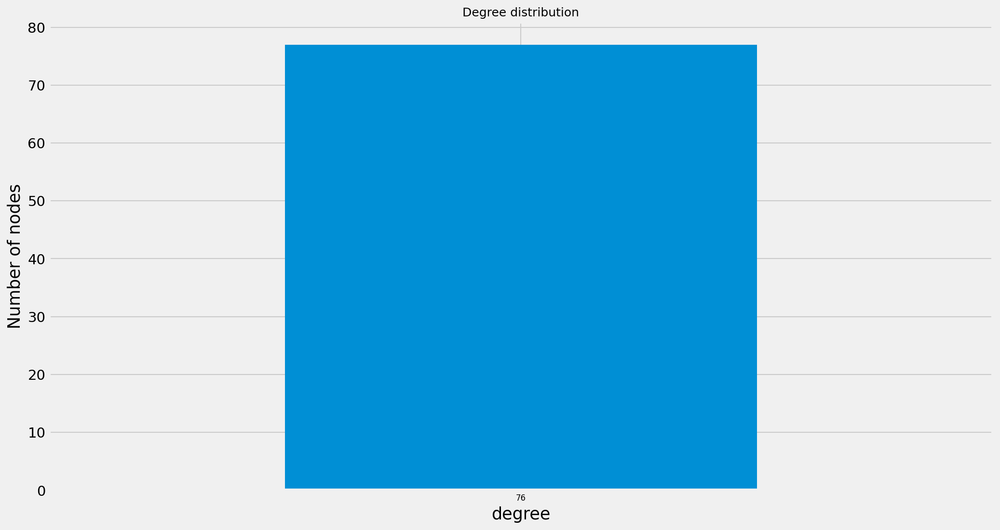

In [89]:
plt.figure(figsize=(15, 8))
degrees = [G_2.degree(node) for node in G_2.nodes()]
degree_df = pd.DataFrame(degrees, columns=["degree"])
degree_df["degree"].value_counts().sort_index().plot(kind="bar")
plt.title("Degree distribution", fontsize=12)
plt.xticks(rotation=0, fontsize=8)
plt.ylabel("Number of nodes")
plt.show()

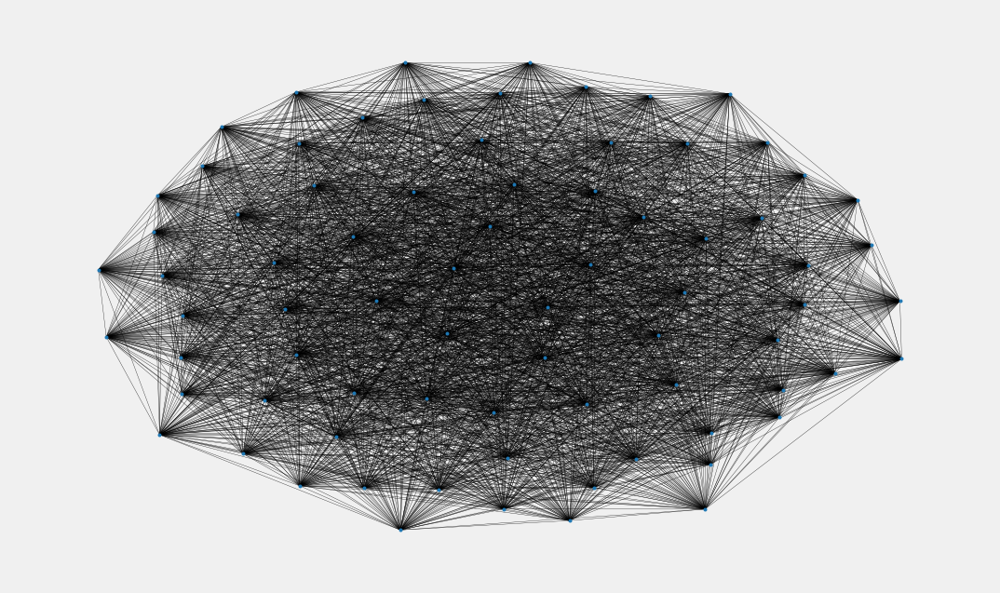

In [90]:
fig, ax = plt.subplots(figsize=(8, 5))
pos = nx.spring_layout(G_2)
ax.axis("off")
plot_options = {"node_size": 2, "with_labels": False, "width": 0.15}
nx.draw_networkx(G_2, pos=pos, ax=ax, **plot_options)

In [91]:
np.mean([d for _, d in G_2.degree()])

76.0

In [92]:
shortest_path_lengths = dict(nx.all_pairs_shortest_path_length(G_2))

In [93]:
diameter = max(nx.eccentricity(G_2, sp=shortest_path_lengths).values())
diameter

1

In [94]:
average_path_lengths = [
    np.mean(list(spl.values())) for spl in shortest_path_lengths.values()
]
# The average over all nodes
np.mean(average_path_lengths)

0.9870129870129872

In [95]:
nx.density(G_2)

1.0

In [96]:
nx.number_connected_components(G)

1

In [97]:
degree_centrality = nx.centrality.degree_centrality(
    G_2
)  # save results in a variable to use again
(sorted(degree_centrality.items(), key=lambda item: item[1], reverse=True))[:8]

[(0, 1.0),
 (1, 1.0),
 (2, 1.0),
 (3, 1.0),
 (4, 1.0),
 (5, 1.0),
 (6, 1.0),
 (7, 1.0)]

In [98]:
(sorted(G_2.degree, key=lambda item: item[1], reverse=True))[:8]

[(0, 76), (1, 76), (2, 76), (3, 76), (4, 76), (5, 76), (6, 76), (7, 76)]

Text(0, 0.5, 'Counts')

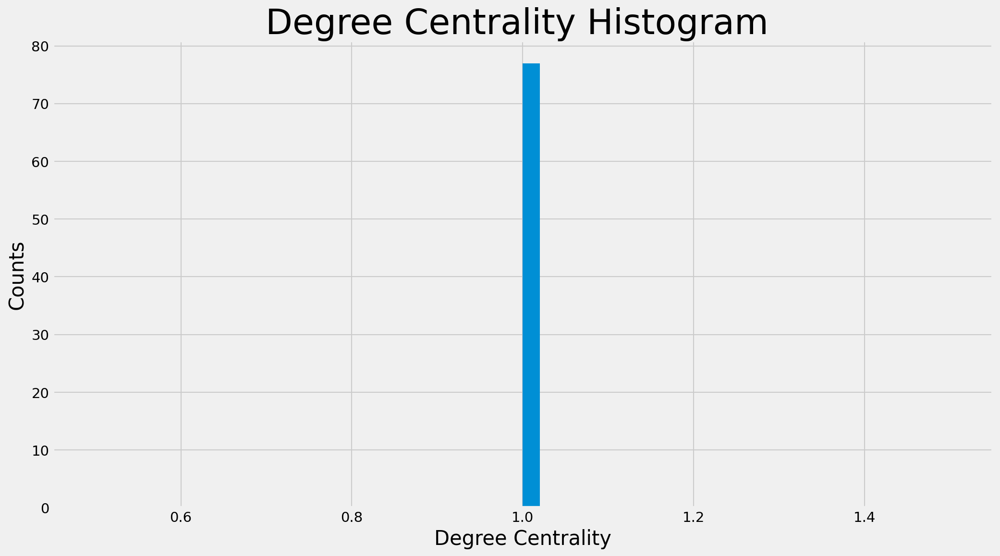

In [99]:
plt.figure(figsize=(15, 8))
plt.hist(degree_centrality.values(), bins=50)
#plt.xticks(ticks=[0, 0.025, 0.05, 0.1, 0.15, 0.2])  # set the x axis ticks
plt.title("Degree Centrality Histogram ", fontdict={"size": 35}, loc="center")
plt.xlabel("Degree Centrality", fontdict={"size": 20})
plt.ylabel("Counts", fontdict={"size": 20})

(-1.1928639668674608,
 1.2083716891593514,
 -1.1914049723862103,
 1.1673189079568043)

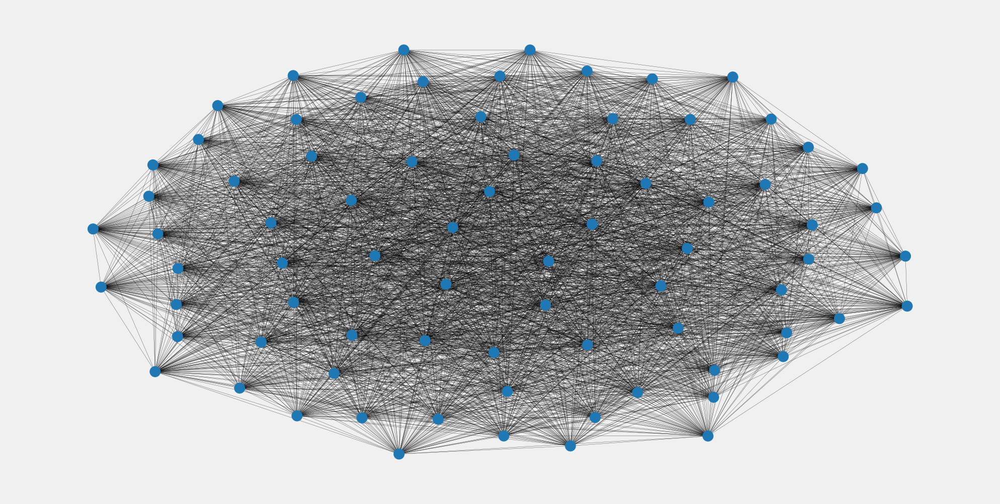

In [100]:
node_size = [
    v * 100 for v in degree_centrality.values()
]  # set up nodes size for a nice graph representation
plt.figure(figsize=(15, 8))
nx.draw_networkx(G_2, pos=pos, node_size=node_size, with_labels=False, width=0.15)
plt.axis("off")

In [101]:
closeness_centrality = nx.centrality.closeness_centrality(
    G_2
)  # save results in a variable to use again
(sorted(closeness_centrality.items(), key=lambda item: item[1], reverse=True))[:8]

[(0, 1.0),
 (1, 1.0),
 (2, 1.0),
 (3, 1.0),
 (4, 1.0),
 (5, 1.0),
 (6, 1.0),
 (7, 1.0)]

Text(0, 0.5, 'Counts')

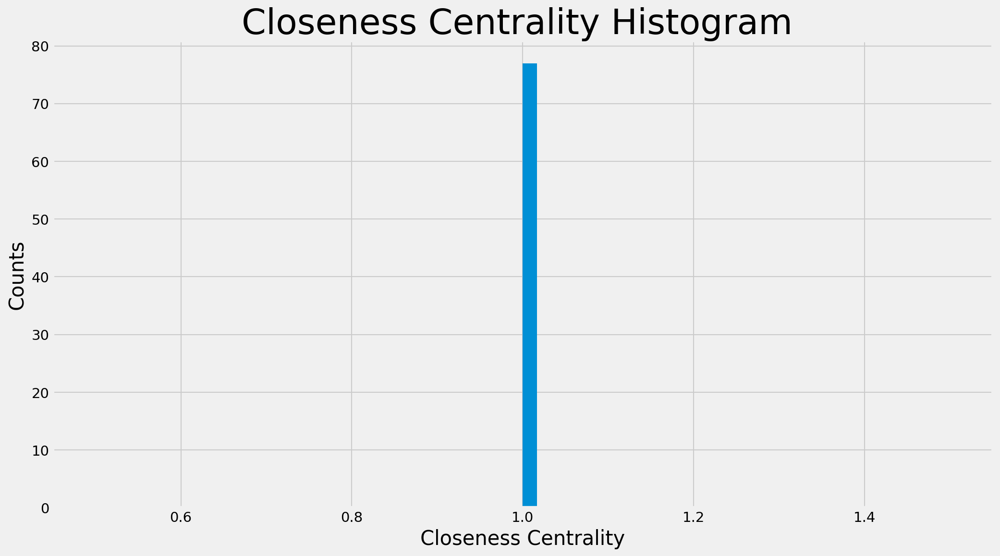

In [102]:
plt.figure(figsize=(15, 8))
plt.hist(closeness_centrality.values(), bins=60)
plt.title("Closeness Centrality Histogram ", fontdict={"size": 35}, loc="center")
plt.xlabel("Closeness Centrality", fontdict={"size": 20})
plt.ylabel("Counts", fontdict={"size": 20})

(-1.1928639668674608,
 1.2083716891593514,
 -1.1914049723862103,
 1.1673189079568043)

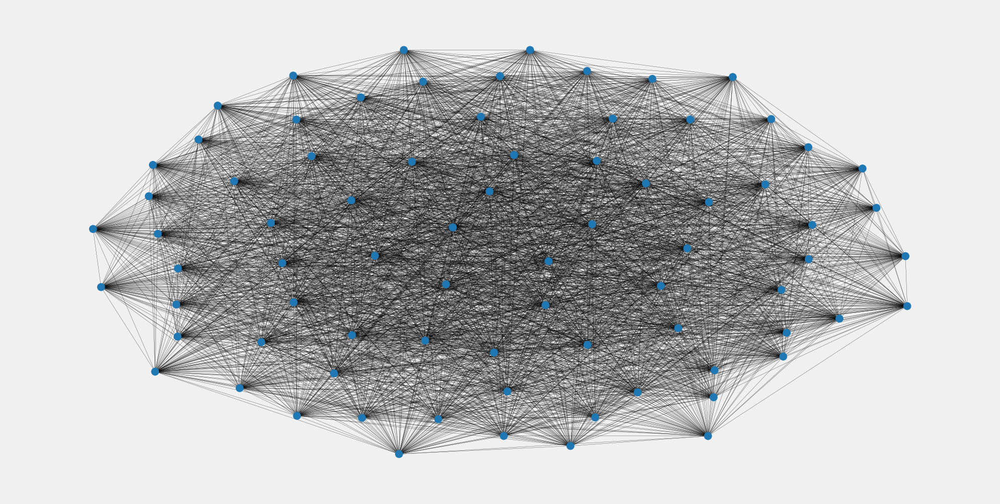

In [103]:
node_size = [
    v * 50 for v in closeness_centrality.values()
]  # set up nodes size for a nice graph representation
plt.figure(figsize=(15, 8))
nx.draw_networkx(G_2, pos=pos, node_size=node_size, with_labels=False, width=0.15)
plt.axis("off")

In [104]:
G_3 = nx.full_rary_tree(12, 250)

In [105]:
print(G_3)

Graph with 250 nodes and 249 edges


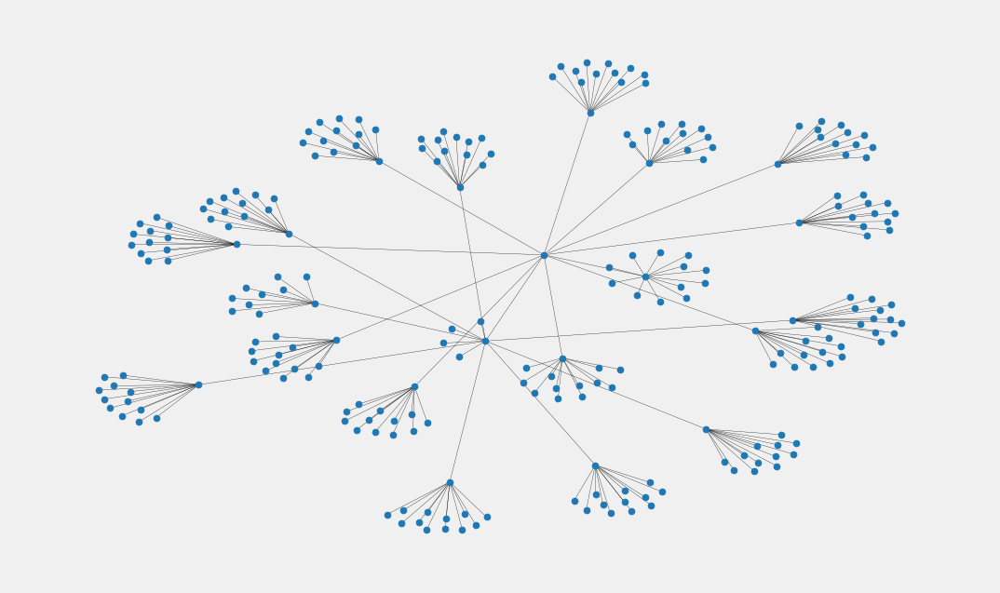

In [106]:
fig, ax = plt.subplots(figsize=(8, 5))
ax.axis("off")
plot_options = {"node_size": 10, "with_labels": False, "width": 0.15}
nx.draw_networkx(G_3, pos=nx.spring_layout(G_3), ax=ax, **plot_options)

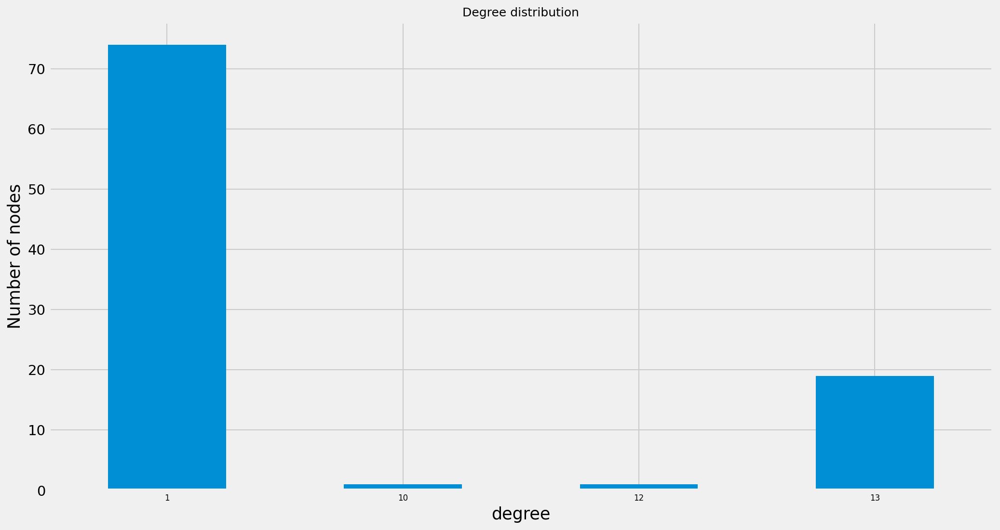

In [107]:
plt.figure(figsize=(15, 8))
degrees = [G_3.degree(node) for node in G_1.nodes()]
degree_df = pd.DataFrame(degrees, columns=["degree"])
degree_df["degree"].value_counts().sort_index().plot(kind="bar")
plt.title("Degree distribution", fontsize=12)
plt.xticks(rotation=0, fontsize=8)
plt.ylabel("Number of nodes")
plt.show()

In [108]:
np.mean([d for _, d in G_3.degree()])

1.992

In [109]:
shortest_path_lengths = dict(nx.all_pairs_shortest_path_length(G_3))

In [110]:
diameter = max(nx.eccentricity(G_3, sp=shortest_path_lengths).values())
diameter

5

In [111]:
average_path_lengths = [
    np.mean(list(spl.values())) for spl in shortest_path_lengths.values()
]
# The average over all nodes
np.mean(average_path_lengths)

4.164576000000001

Text(0, 0.5, 'Frequency (%)')

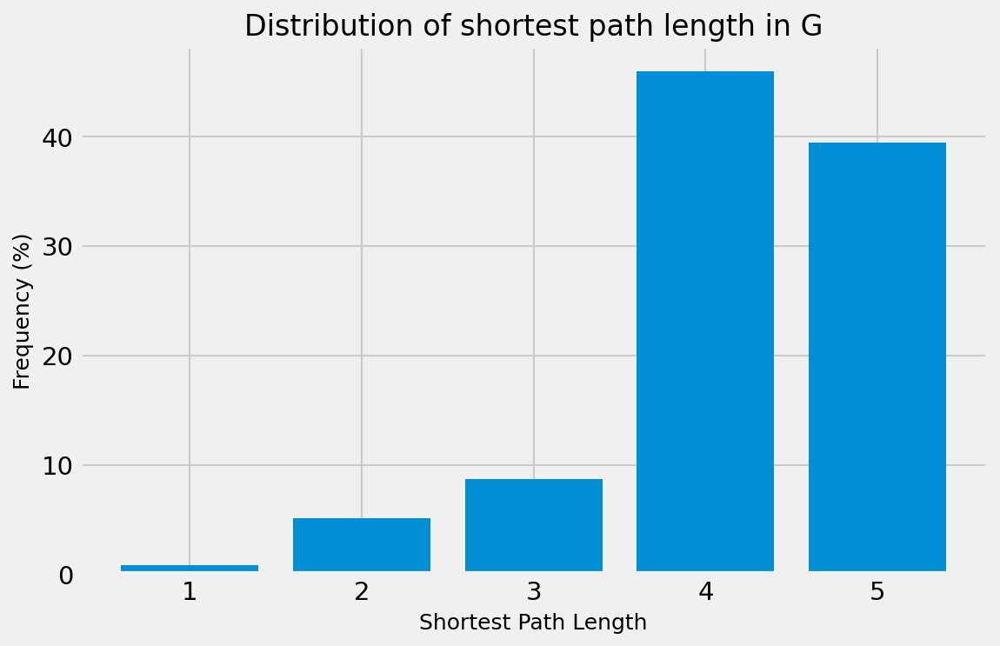

In [112]:
path_lengths = np.zeros(diameter + 1, dtype=int)

for pls in shortest_path_lengths.values():
    pl, cnts = np.unique(list(pls.values()), return_counts=True)
    path_lengths[pl] += cnts

freq_percent = 100 * path_lengths[1:] / path_lengths[1:].sum()

fig, ax = plt.subplots(figsize=(8, 5))
ax.bar(np.arange(1, diameter + 1), height=freq_percent)
ax.set_title(
    "Distribution of shortest path length in G", fontdict={"size": 16}, loc="center"
)
ax.set_xlabel("Shortest Path Length", fontdict={"size": 12})
ax.set_ylabel("Frequency (%)", fontdict={"size": 12})

In [113]:
nx.density(G_3)

0.008

In [114]:
nx.number_connected_components(G_3)

1

In [115]:
degree_centrality = nx.centrality.degree_centrality(
    G_3
)  # save results in a variable to use again
(sorted(degree_centrality.items(), key=lambda item: item[1], reverse=True))[:8]

[(1, 0.05220883534136546),
 (2, 0.05220883534136546),
 (3, 0.05220883534136546),
 (4, 0.05220883534136546),
 (5, 0.05220883534136546),
 (6, 0.05220883534136546),
 (7, 0.05220883534136546),
 (8, 0.05220883534136546)]

In [116]:
(sorted(G_3.degree, key=lambda item: item[1], reverse=True))[:8]

[(1, 13), (2, 13), (3, 13), (4, 13), (5, 13), (6, 13), (7, 13), (8, 13)]

Text(0, 0.5, 'Counts')

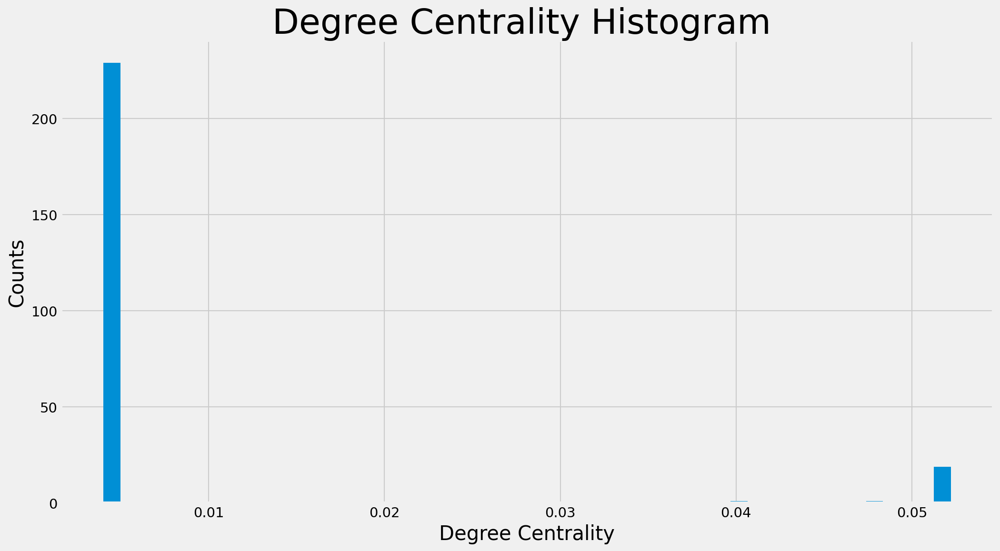

In [117]:
plt.figure(figsize=(15, 8))
plt.hist(degree_centrality.values(), bins=50)
#plt.xticks(ticks=[0, 0.025, 0.05, 0.1, 0.15, 0.2])  # set the x axis ticks
plt.title("Degree Centrality Histogram ", fontdict={"size": 35}, loc="center")
plt.xlabel("Degree Centrality", fontdict={"size": 20})
plt.ylabel("Counts", fontdict={"size": 20})

(-1.136040457305284,
 1.2029721701511809,
 -0.9046150317260198,
 1.015788526090972)

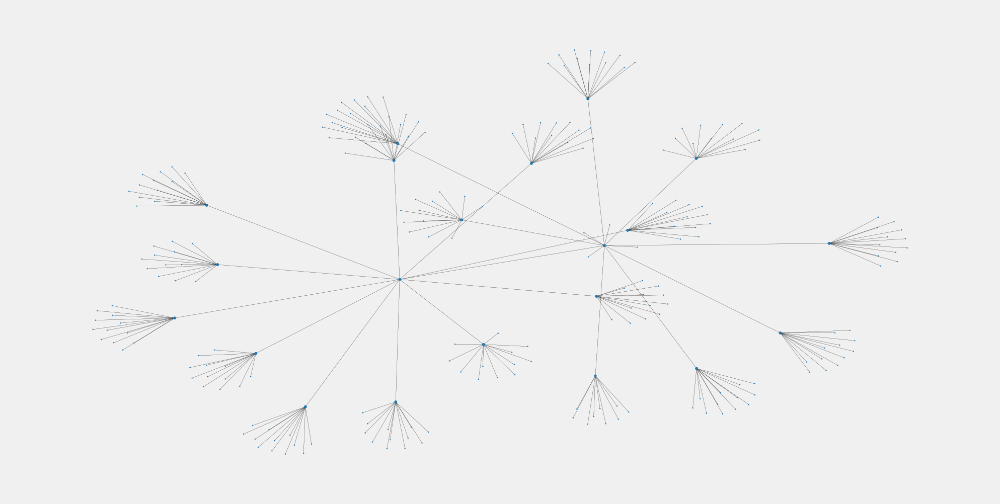

In [118]:
node_size = [
    v * 100 for v in degree_centrality.values()
]  # set up nodes size for a nice graph representation
plt.figure(figsize=(15, 8))
nx.draw_networkx(G_3, pos=nx.spring_layout(G_3), node_size=node_size, with_labels=False, width=0.15)
plt.axis("off")

In [119]:
closeness_centrality = nx.centrality.closeness_centrality(
    G
)  # save results in a variable to use again
(sorted(closeness_centrality.items(), key=lambda item: item[1], reverse=True))[:8]

[(67, 0.6480263157894737),
 (7, 0.5898203592814372),
 (23, 0.5811209439528023),
 (90, 0.5596590909090909),
 (93, 0.5580736543909348),
 (20, 0.5549295774647888),
 (101, 0.5487465181058496),
 (74, 0.5487465181058496)]

Text(0, 0.5, 'Counts')

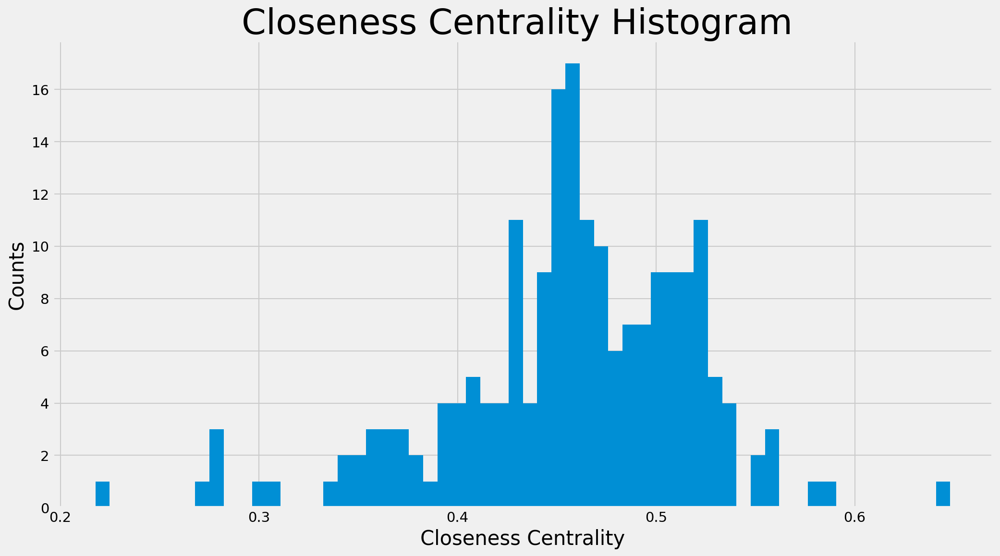

In [120]:
plt.figure(figsize=(15, 8))
plt.hist(closeness_centrality.values(), bins=60)
plt.title("Closeness Centrality Histogram ", fontdict={"size": 35}, loc="center")
plt.xlabel("Closeness Centrality", fontdict={"size": 20})
plt.ylabel("Counts", fontdict={"size": 20})

(-0.512361565348264,
 0.7801855087117263,
 -1.1847113512125707,
 0.9438670770465771)

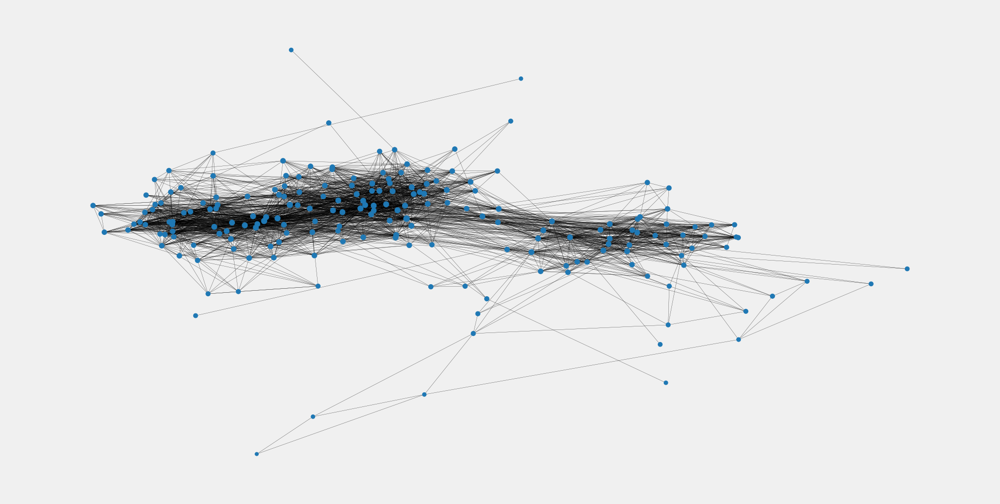

In [121]:
pos = nx.spring_layout(G, iterations=15, seed=1721)
node_size = [
    v * 50 for v in closeness_centrality.values()
]  # set up nodes size for a nice graph representation
plt.figure(figsize=(15, 8))
nx.draw_networkx(G, pos=pos, node_size=node_size, with_labels=False, width=0.15)
plt.axis("off")